In [1]:
import os
print(os.getcwd())

/workspaces/ecommerce/olist_dwh


In [2]:
import pandas as pd
from sqlalchemy import create_engine
import plotly.express as px
from urllib.parse import quote_plus 

# --- 1. Connect to the Database ---
# (This uses the same Codespace secrets we've been using all along)
user = os.environ.get('POSTGRES_USER')
password = os.environ.get('POSTGRES_PASSWORD')
host = 'localhost'
port = 5432
db_name = os.environ.get('POSTGRES_DB')

# --- ADDED: Safely encode the password for the connection string ---
password_encoded = quote_plus(password)

# Create the database connection engine
engine = create_engine(f'postgresql://{user}:{password_encoded}@{host}:{port}/{db_name}')

print("✅ Database connection successful.")

✅ Database connection successful.


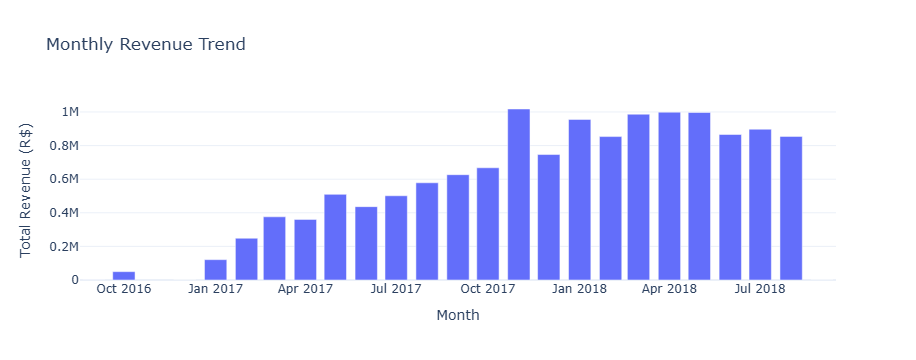

In [3]:
# --- Monthly Revenue Analysis ---

with open('analyses/sales_monthly_revenue.sql', 'r') as f:
    query = f.read().replace("{{ ref('fact_orders') }}", "analytics.fact_orders")

df = pd.read_sql_query(query, engine)

# Create the visualization
fig = px.bar(
    df,
    x='sales_month',
    y='monthly_revenue',
    title='Monthly Revenue Trend',
    labels={'sales_month': 'Month', 'monthly_revenue': 'Total Revenue (R$)'},
    template='plotly_white'
)
fig.show()

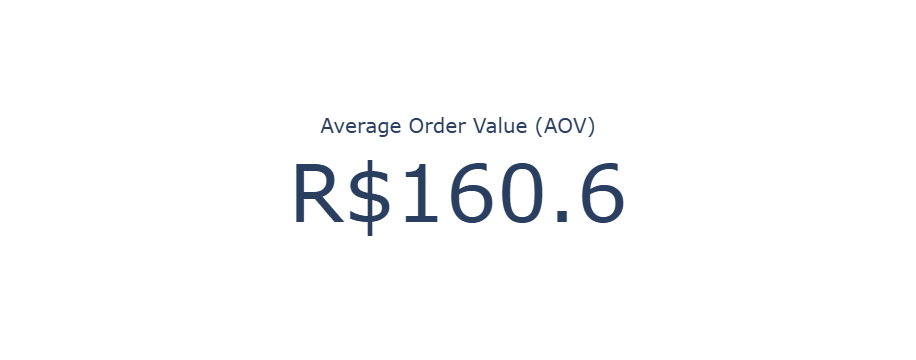

In [4]:
# --- Average Order Value (AOV) ---
import plotly.graph_objects as go

# Corrected: Read the SQL file AND replace the ref()
with open('analyses/kpi_aov.sql', 'r') as f:
    query = f.read().replace("{{ ref('fact_orders') }}", "analytics.fact_orders")

df = pd.read_sql_query(query, engine)
aov_value = df['average_order_value'].iloc[0]

fig = go.Figure(go.Indicator(
    mode = "number",
    value = aov_value,
    title = {"text": "Average Order Value (AOV)"},
    number = {'prefix': "R$"}
))
fig.show()

In [5]:
# --- Customer Distribution by State ---

# Corrected: Read the SQL file AND replace the ref()
with open('analyses/kpi_customer_distribution.sql', 'r') as f:
    query = f.read().replace("{{ ref('fact_orders') }}", "analytics.fact_orders")

df = pd.read_sql_query(query, engine)

fig = px.bar(
    df,
    x='state',
    y='number_of_customers',
    title='Top 10 States by Customer Count',
    labels={'state': 'State', 'number_of_customers': 'Number of Customers'},
    template='plotly_white'
)
fig.show()

In [6]:
# --- Top 10 High-Value Customers ---

# Corrected: Read the SQL file AND replace the ref()
with open('analyses/cust_top_customers.sql', 'r') as f:
    query = f.read().replace("{{ ref('fact_orders') }}", "analytics.fact_orders")

df = pd.read_sql_query(query, engine)

fig = px.bar(
    df,
    y='customer_unique_id',
    x='total_spent',
    title='Top 10 Customers by Total Spending',
    labels={'customer_unique_id': 'Customer ID', 'total_spent': 'Total Spent (R$)'},
    template='plotly_white',
    orientation='h'
).update_yaxes(categoryorder="total ascending")
fig.show()

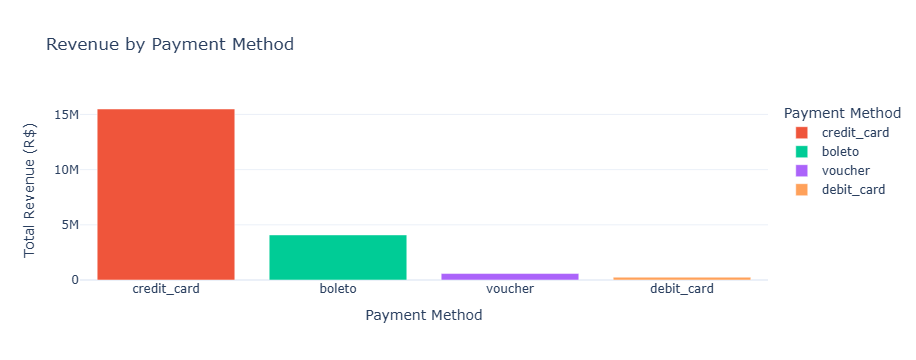

In [7]:
# --- Revenue by Payment Method ---

with open('analyses/sales_revenue_by_payment_method.sql', 'r') as f:
    query = f.read().replace("{{ ref('fact_orders') }}", "analytics.fact_orders")

df = pd.read_sql_query(query, engine)

fig = px.bar(
    df,
    x='primary_payment_type',
    y='total_revenue',
    color='primary_payment_type',
    title='Revenue by Payment Method',
    labels={'primary_payment_type': 'Payment Method', 'total_revenue': 'Total Revenue (R$)'},
    template='plotly_white'
)
fig.show()

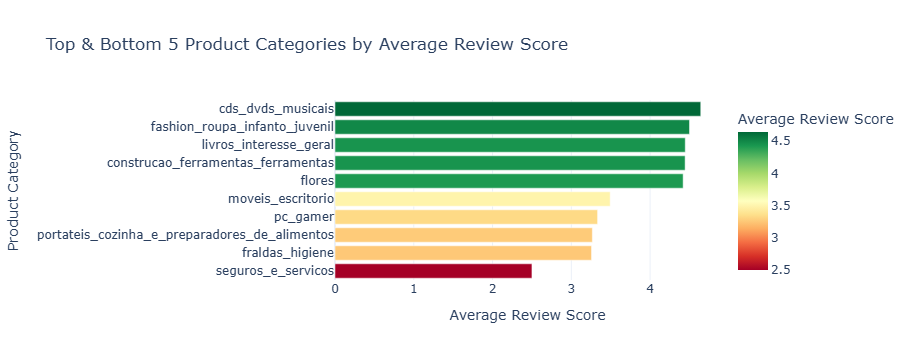

In [8]:
# --- Top & Bottom 5 Categories by Review Score ---

with open('analyses/cust_review_scores_by_category.sql', 'r') as f:
    query = f.read().replace("{{ ref('fact_orders') }}", "analytics.fact_orders")

df = pd.read_sql_query(query, engine)

fig = px.bar(
    df,
    x='average_review_score',
    y='product_category',
    color='average_review_score',
    color_continuous_scale='RdYlGn', # Red -> Yellow -> Green color scale
    title='Top & Bottom 5 Product Categories by Average Review Score',
    labels={'product_category': 'Product Category', 'average_review_score': 'Average Review Score'},
    template='plotly_white',
    orientation='h'
).update_yaxes(categoryorder="total ascending")
fig.show()

In [9]:
# --- EDA: Repeat Purchase Rate ---

# We only need the order_id and customer_unique_id for this analysis
query = "select order_id, customer_unique_id from analytics.fact_orders"
df_customers = pd.read_sql_query(query, engine)

# Count the number of orders per unique customer
customer_order_counts = df_customers.groupby('customer_unique_id')['order_id'].nunique().reset_index(name='order_count')

# Identify customers with more than one order
repeat_customers = customer_order_counts[customer_order_counts['order_count'] > 1].shape[0]
total_customers = customer_order_counts.shape[0]

# Calculate the repeat rate
repeat_rate = (repeat_customers / total_customers) * 100

print(f"Total Unique Customers: {total_customers}")
print(f"Customers with >1 Order: {repeat_customers}")
print(f"Repeat Purchase Rate: {repeat_rate:.2f}%")

Total Unique Customers: 95420
Customers with >1 Order: 2913
Repeat Purchase Rate: 3.05%


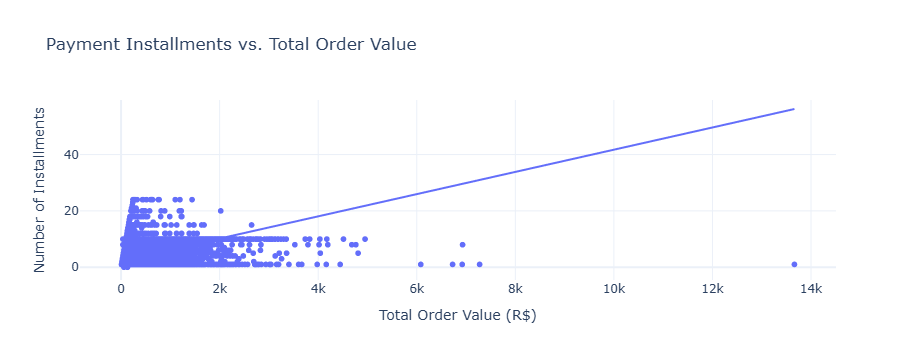

In [10]:
# --- EDA: Payment Installments vs. Order Value ---

# We only need distinct order information for this
query = "select distinct order_id, total_payment_value, max_payment_installments from analytics.fact_orders"
df_payments = pd.read_sql_query(query, engine)

fig = px.scatter(
    df_payments,
    x='total_payment_value',
    y='max_payment_installments',
    title='Payment Installments vs. Total Order Value',
    labels={'total_payment_value': 'Total Order Value (R$)', 'max_payment_installments': 'Number of Installments'},
    template='plotly_white',
    trendline='ols' # Add a trendline to see the correlation
)
fig.show()

# Phase 4 - Data Science and Machine Learning 🧠
## First Model - Review Score Classifier
### Step 1: Data Preparation

In [11]:
# --- 1. Load the Full Dataset ---
print("Loading data from fact_orders...")
query = "SELECT * FROM analytics.fact_orders"
df_model = pd.read_sql_query(query, engine)
print(f"Loaded {df_model.shape[0]} rows of data.")
print("-" * 30)


# --- 2. Handle Missing Values ---
# For our first model, we'll use a simple strategy: remove rows where
# the review score or delivery date is missing, as they are critical.
initial_rows = df_model.shape[0]
df_model.dropna(subset=['review_score', 'delivered_to_customer_at', 'days_to_delivery'], inplace=True)
print(f"Removed {initial_rows - df_model.shape[0]} rows with missing critical values.")
print(f"Remaining rows: {df_model.shape[0]}")
print("-" * 30)


# --- 3. Create the Target Variable ---
# We want to predict a binary outcome: was the review score low (1 or 2) or not?
# This creates a new column `is_low_score` with 1 for low scores and 0 for others.
df_model['is_low_score'] = (df_model['review_score'] <= 2).astype(int)
print("Created target variable 'is_low_score'.")
print("-" * 30)


# --- 4. Verify the Target Variable ---
# Let's see the distribution of our target.
print("Distribution of Low vs. High Review Scores:")
print(df_model['is_low_score'].value_counts(normalize=True))

# Display the first few rows of our prepared DataFrame
print("\nData is now ready for feature selection. Here's a preview:")
display(df_model.head())

Loading data from fact_orders...
Loaded 113314 rows of data.
------------------------------
Removed 3302 rows with missing critical values.
Remaining rows: 110012
------------------------------
Created target variable 'is_low_score'.
------------------------------
Distribution of Low vs. High Review Scores:
is_low_score
0    0.852034
1    0.147966
Name: proportion, dtype: float64

Data is now ready for feature selection. Here's a preview:


,order_item_id,order_id,seller_id,product_id,customer_id,customer_unique_id,purchased_at,order_status,delivered_to_customer_at,product_category,...,price,freight_value,total_payment_value,max_payment_installments,primary_payment_type,review_score,review_comment_message,days_to_delivery,is_late,is_low_score
0,1,001c85b5f68d2be0cb0797afc9e8ce9a,4a3ca9315b744ce9f8e9374361493884,84f456958365164420cfc80fbe4c7fab,48ed31e735f1c420ed6ca3637b7c744d,55a269f324455e78349e7b9b7e7e5911,2017-11-24 19:19:18,delivered,2017-12-22 18:37:40,cama_mesa_banho,...,99.00,13.71,112.71,4.0,credit_card,2.0,None,28.0,True,1
1,1,001d8f0e34a38c37f7dba2a37d4eba8b,f4aba7c0bca51484c30ab7bdc34bcdd1,e67307ff0f15ade43fcb6e670be7a74c,d987da9fb4086ab7c2c0f83963cd6722,870a0bdc769f9a7870309036740e79ea,2017-05-14 17:19:44,delivered,2017-05-26 13:14:50,beleza_saude,...,18.99,7.78,53.54,2.0,credit_card,1.0,Entrega prometida 24/05/17. Dia 26/05/17 não h...,12.0,True,1
2,2,001d8f0e34a38c37f7dba2a37d4eba8b,f4aba7c0bca51484c30ab7bdc34bcdd1,e67307ff0f15ade43fcb6e670be7a74c,d987da9fb4086ab7c2c0f83963cd6722,870a0bdc769f9a7870309036740e79ea,2017-05-14 17:19:44,delivered,2017-05-26 13:14:50,beleza_saude,...,18.99,7.78,53.54,2.0,credit_card,1.0,Entrega prometida 24/05/17. Dia 26/05/17 não h...,12.0,True,1
3,1,00254baeb6c932b0a8aeead91fbd02b5,e8b4225284fbb02d16f200513f1f395d,18901878788fec7ddc55e64d1ace8187,ce0421a97232c2a1194cdb66cd3ebb9d,f99edeaa8a00f9866fd8fce5a0b83d4f,2018-05-08 21:45:54,delivered,2018-05-30 19:38:36,bebes,...,149.90,43.11,193.01,2.0,credit_card,5.0,None,22.0,False,0
4,1,002d040018d12a3853c059f7f23ab5b1,fe2032dab1a61af8794248c8196565c9,97c58626cc3e15d514d2095f69650220,d7a77284d0a56f6b1ecb8c344b60d3e4,125afe43321f838bed64b7e0ecfddba4,2017-11-19 19:16:07,delivered,2017-11-27 18:54:09,perfumaria,...,155.00,14.84,169.84,1.0,boleto,3.0,None,8.0,False,0


### Step 2: Feature Selection and Engineering

In [12]:
# --- 1. Define Features (X) and Target (y) ---

# Choose a set of numerical and categorical features
numerical_features = ['price', 'freight_value', 'days_to_delivery']
categorical_features = ['product_category', 'seller_state', 'is_late']
features = numerical_features + categorical_features

target = 'is_low_score'

# Create our feature matrix (X) and target vector (y)
X = df_model[features]
y = df_model[target]

print("Selected features:")
print(X.head())
print("-" * 30)


# --- 2. Handle Categorical Features with One-Hot Encoding ---

# Machine learning models only understand numbers. We need to convert
# our categorical text columns into a numerical format.
# One-hot encoding creates a new binary (0 or 1) column for each category.
X_encoded = pd.get_dummies(X, columns=categorical_features, drop_first=True)

print("Features after one-hot encoding:")
print(f"New shape of X: {X_encoded.shape}")
print("Note the new columns like 'product_category_...' and 'seller_state_...'\n")
display(X_encoded.head())

Selected features:
    price  freight_value  days_to_delivery product_category seller_state  \
0   99.00          13.71              28.0  cama_mesa_banho           SP   
1   18.99           7.78              12.0     beleza_saude           SP   
2   18.99           7.78              12.0     beleza_saude           SP   
3  149.90          43.11              22.0            bebes           SP   
4  155.00          14.84               8.0       perfumaria           SP   

   is_late  
0     True  
1     True  
2     True  
3    False  
4    False  
------------------------------
Features after one-hot encoding:
New shape of X: (110012, 97)
Note the new columns like 'product_category_...' and 'seller_state_...'



,price,freight_value,days_to_delivery,product_category_alimentos,product_category_alimentos_bebidas,product_category_artes,product_category_artes_e_artesanato,product_category_artigos_de_festas,product_category_artigos_de_natal,product_category_audio,...,seller_state_PI,seller_state_PR,seller_state_RJ,seller_state_RN,seller_state_RO,seller_state_RS,seller_state_SC,seller_state_SE,seller_state_SP,is_late_True
0,99.00,13.71,28.0,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,True
1,18.99,7.78,12.0,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,True
2,18.99,7.78,12.0,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,True
3,149.90,43.11,22.0,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
4,155.00,14.84,8.0,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False


### Step 3: Model Training

In [13]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

# --- 1. Split Data into Training and Testing Sets ---

# We'll use 80% of the data to train the model and 20% to test its performance.
# `random_state` ensures that we get the same split every time we run the code.
X_train, X_test, y_train, y_test = train_test_split(
    X_encoded, y, test_size=0.2, random_state=42
)

# --- 2. Scale the Numerical Features ---
# Create a scaler object
scaler = StandardScaler()

# Fit the scaler ONLY on the training data and transform it
X_train[numerical_features] = scaler.fit_transform(X_train[numerical_features])

# Use the same fitted scaler to transform the test data
X_test[numerical_features] = scaler.transform(X_test[numerical_features])

print("✅ Numerical features scaled successfully.")
print("\nData split into training and testing sets:")
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print("-" * 30)


# --- 3. Initialize and Train the Model ---

# We'll use a simple Logistic Regression model.
# `max_iter` is set to a higher value to ensure the model has enough time to find the best solution.
model = LogisticRegression(max_iter=1000)

# The .fit() method is where the model "learns" from the training data.
model.fit(X_train, y_train)

print("✅ Model training complete.")

✅ Numerical features scaled successfully.

Data split into training and testing sets:
X_train shape: (88009, 97)
X_test shape: (22003, 97)
------------------------------
✅ Model training complete.


In [14]:
from sklearn.metrics import classification_report, confusion_matrix

# --- 1. Make Predictions on the Test Set ---
# Use the trained model to predict outcomes for the test data
y_pred = model.predict(X_test)


# --- 2. Generate and Print the Classification Report ---
print("--- Classification Report ---")
# This report shows the main classification metrics
report = classification_report(y_test, y_pred, target_names=['High Score (0)', 'Low Score (1)'])
print(report)


# --- 3. Generate and Visualize the Confusion Matrix ---
print("--- Confusion Matrix ---")
# A confusion matrix shows the number of correct and incorrect predictions
cm = confusion_matrix(y_test, y_pred)

# Use Plotly to create a heatmap for a better visual
fig = px.imshow(
    cm,
    text_auto=True,
    labels=dict(x="Predicted Label", y="True Label"),
    x=['Predicted High Score', 'Predicted Low Score'],
    y=['Actual High Score', 'Actual Low Score'],
    title="Confusion Matrix",
    color_continuous_scale='Blues'
)
fig.show()

--- Classification Report ---
                precision    recall  f1-score   support

High Score (0)       0.88      0.98      0.93     18816
 Low Score (1)       0.66      0.22      0.33      3187

      accuracy                           0.87     22003
     macro avg       0.77      0.60      0.63     22003
  weighted avg       0.85      0.87      0.84     22003

--- Confusion Matrix ---


In [15]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import classification_report, roc_auc_score, precision_recall_curve, auc
import lightgbm as lgb

# --- 1. Define the Model and Parameter Grid ---

# Initialize a LightGBM Classifier. 'class_weight' tells it to penalize errors
# on the minority class (low scores) more heavily.
model = lgb.LGBMClassifier(class_weight='balanced', random_state=42)

# Define the range of hyperparameters to test
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'num_leaves': [20, 31, 40],
    'max_depth': [-1, 10, 20],
    'reg_alpha': [0.1, 0.5], # L1 regularization
    'reg_lambda': [0.1, 0.5] # L2 regularization
}

# --- 2. Set Up the Randomized Search ---

# RandomizedSearchCV will test 10 random combinations from the param_grid
# using 3-fold cross-validation. We tell it to optimize for 'recall'.
random_search = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_grid,
    n_iter=10,
    scoring='recall', # Our primary goal is to find low scores (recall)
    cv=3,
    refit=True, # Refit the best model on the entire training set
    n_jobs=-1,  # Use all available CPU cores
    random_state=42,
    verbose=1
)

# --- 3. Run the Search ---
print("Starting hyperparameter tuning...")
random_search.fit(X_train, y_train)
print("\n✅ Hyperparameter tuning complete.")
print("-" * 30)

# --- 4. Display the Best Parameters ---
print("Best parameters found:")
print(random_search.best_params_)

# Store the best model found by the search
best_model = random_search.best_estimator_

Starting hyperparameter tuning...
Fitting 3 folds for each of 10 candidates, totalling 30 fits
[LightGBM] [Info] Number of positive: 8727, number of negative: 49945
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 760
[LightGBM] [Info] Number of data points in the train set: 58672, number of used features: 81
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Info] Number of positive: 8727, number of negative: 49946
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009759 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 758
[LightGBM] [Info] Nu

In [16]:
# --- 1. Make Predictions with the Best Model ---
y_pred_tuned = best_model.predict(X_test)
y_pred_proba_tuned = best_model.predict_proba(X_test)[:, 1] # Get probabilities for the positive class

# --- 2. Display the New Classification Report ---
print("--- Tuned Model Classification Report ---")
report_tuned = classification_report(y_test, y_pred_tuned, target_names=['High Score (0)', 'Low Score (1)'])
print(report_tuned)


# --- 3. Visualize the New Confusion Matrix ---
print("\n--- Tuned Model Confusion Matrix ---")
cm_tuned = confusion_matrix(y_test, y_pred_tuned)

fig_tuned = px.imshow(
    cm_tuned,
    text_auto=True,
    labels=dict(x="Predicted Label", y="True Label"),
    x=['Predicted High Score', 'Predicted Low Score'],
    y=['Actual High Score', 'Actual Low Score'],
    title="Tuned Model Confusion Matrix",
    color_continuous_scale='Blues'
)
fig_tuned.show()


# --- 4. Calculate Precision-Recall AUC (a better metric for imbalanced data) ---
precision, recall, _ = precision_recall_curve(y_test, y_pred_proba_tuned)
pr_auc = auc(recall, precision)

print(f"\nPrecision-Recall AUC for the tuned model: {pr_auc:.4f}")

--- Tuned Model Classification Report ---
                precision    recall  f1-score   support

High Score (0)       0.91      0.85      0.88     18816
 Low Score (1)       0.36      0.49      0.42      3187

      accuracy                           0.80     22003
     macro avg       0.63      0.67      0.65     22003
  weighted avg       0.83      0.80      0.81     22003


--- Tuned Model Confusion Matrix ---



Precision-Recall AUC for the tuned model: 0.4403


#### The Big Win: Recall More Than Doubled
The most important number here is recall for the "Low Score (1)" class.
* Old Model Recall: 22%
* New Model Recall: 49% <br>

This is a huge improvement. It means our model went from finding only about **1 in 5** bad reviews to finding almost **1 in 2**. For the business goal of "alerting for at-risk orders," we are now identifying more than twice as many unhappy customers, which is a massive success.

#### Why Accuracy Went Down (And Why It's a Good Thing)
You'll also notice the overall **accuracy** dropped from **87% to 80%**. This is a positive sign. It shows that our model is no longer "cheating" by simply predicting the majority "High Score" class to get an easy high score. It is now trying much harder to find the rare, **difficult-to-predict "Low Score" cases**, and as a result, it makes more mistakes on the majority class, lowering the overall accuracy. This is why accuracy is a misleading metric for imbalanced problems.

## Second Model - Delivery Delay Modeling

In [17]:
print("Loading data from fct_delivery_performance...")
query = "SELECT * FROM analytics.fct_delivery_performance"
df_delivery = pd.read_sql_query(query, engine)

print(f"Loaded {df_delivery.shape[0]} rows of data.")
print("Data is now ready for model training. Here's a preview:")
display(df_delivery.head())

Loading data from fct_delivery_performance...
Loaded 97803 rows of data.
Data is now ready for model training. Here's a preview:


,order_id,customer_id,purchased_at,seller_id,is_late,seller_handling_days,carrier_transit_days,purchase_day_of_week,purchase_month,distance_km,number_of_items,total_price,total_freight_value,seller_state,customer_state
0,00061f2a7bc09da83e415a52dc8a4af1,c6fc061d86fab1e2b2eac259bac71a49,2018-03-24 22:16:10,cc419e0650a3c5ba77189a1882b7556a,False,3.0,2.0,6.0,3.0,154.134540,1,59.99,8.88,SP,SP
1,0009c9a17f916a706d71784483a5d643,8a250edc40ebc5c3940ebc940f16a7eb,2018-04-25 09:10:41,fcb5ace8bcc92f75707dc0f01a27d269,False,2.0,3.0,3.0,4.0,79.926118,1,639.00,11.34,SP,SP
2,000e906b789b55f64edcb1f84030f90d,6a3b2fc9f270df258605e22bef19fd88,2017-11-21 18:54:23,ea8482cd71df3c1969d7b9473ff13abc,True,1.0,17.0,2.0,11.0,318.213458,1,21.99,11.85,SP,SP
3,000f25f4d72195062c040b12dce9a18a,86ade8ebc14f18dd6c3ea75bd0eb7534,2018-03-07 10:33:13,7c67e1448b00f6e969d365cea6b010ab,False,9.0,6.0,3.0,3.0,257.272924,1,119.99,44.40,SP,RJ
4,0014ae671de39511f7575066200733b7,41065d9dcea52218c3943d2eed072b97,2017-05-22 13:49:03,92eb0f42c21942b6552362b9b114707d,False,6.0,9.0,1.0,5.0,339.242532,1,16.50,14.10,SP,PR


### Step 1: Add a Date Column to Your dbt Model

### Step 2: Prepare and Split the Data in Python

We will reload the updated data, prepare the features, and perform the crucial time-based split.

In [18]:
# --- 1. Reload the Enriched Data ---
print("Reloading data from fct_delivery_performance...")
query = "SELECT * FROM analytics.fct_delivery_performance"
df_delivery = pd.read_sql_query(query, engine, parse_dates=['purchased_at']) # Parse the date column
print(f"Loaded {df_delivery.shape[0]} rows of data.")
print("-" * 30)


# --- 2. Prepare Features and Target ---
# Handle any remaining nulls from failed joins or calculations
df_delivery.dropna(subset=['seller_handling_days', 'carrier_transit_days', 'seller_state', 'customer_state'], inplace=True)

# Define features and target
# Note: We do not include the target variable 'is_late' in the feature list
features = [
    'seller_handling_days',
    'carrier_transit_days',
    'number_of_items',
    'total_price',
    'total_freight_value',
    'seller_state',
    'customer_state'
]
target = 'is_late'

X = df_delivery[features + ['purchased_at']] # Include purchased_at for sorting
y = df_delivery[target]

# One-hot encode categorical features
X_encoded = pd.get_dummies(X, columns=['seller_state', 'customer_state'], drop_first=True)
print(f"Feature set has {X_encoded.shape[1]} columns after encoding.")
print("-" * 30)


# --- 3. Perform Time-Based Split ---
# Sort the entire dataset by the purchase date
X_sorted = X_encoded.sort_values('purchased_at')
y_sorted = y.loc[X_sorted.index]

# Drop the date column now that we're done sorting, as it's not a feature for the model
X_sorted = X_sorted.drop(columns=['purchased_at'])

# Define an 80/20 split point
split_point = int(len(X_sorted) * 0.8)

# Split the data
X_train = X_sorted.iloc[:split_point]
X_test = X_sorted.iloc[split_point:]
y_train = y_sorted.iloc[:split_point]
y_test = y_sorted.iloc[split_point:]

print("Data split using a time-based method (80/20 split):")
print(f"Training set size: {len(X_train)}")
print(f"Test set size: {len(X_test)}")

Reloading data from fct_delivery_performance...
Loaded 97803 rows of data.
------------------------------
Feature set has 53 columns after encoding.
------------------------------
Data split using a time-based method (80/20 split):
Training set size: 78241
Test set size: 19561


### Step 3: Train and Evaluate the Delivery Delay Model

Training the LightGBM model...
[LightGBM] [Info] Number of positive: 6823, number of negative: 71418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 768
[LightGBM] [Info] Number of data points in the train set: 78241, number of used features: 48
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
✅ Model training complete.
------------------------------
--- Model v1 Classification Report ---
                  precision    recall  f1-score   support

Not Late (False)       0.97      0.98      0.97     18540
     Late (True)       0.52      0.36      0.43      1021

        accuracy                           0.95     19561
       macro avg       0.74      0.67      0.70     19561
    weighted avg       0.94      0.95      0.94     19561


--- Model v1 Confusion Matrix 

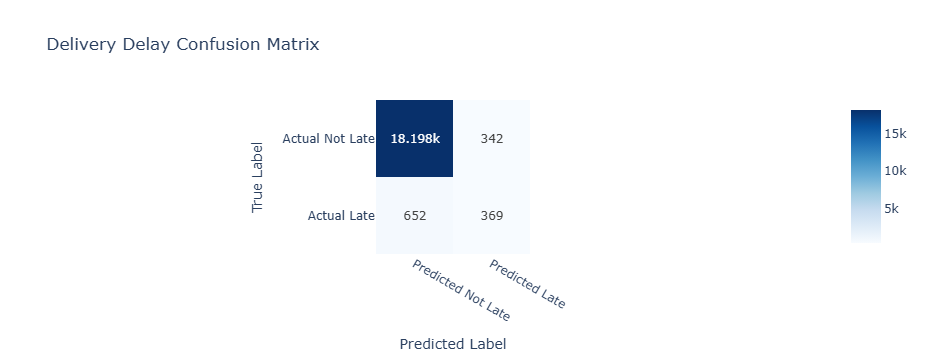

In [19]:
import lightgbm as lgb
from sklearn.metrics import classification_report, confusion_matrix

# --- 1. Initialize and Train the Model ---

# We'll use a LightGBM Classifier. 'class_weight' helps the model
# handle cases where there are fewer late orders than on-time ones.
model = lgb.LGBMClassifier(class_weight='balanced', random_state=42)

print("Training the LightGBM model...")
# The .fit() method is where the model learns from the training data.
model.fit(X_train, y_train)
print("✅ Model training complete.")
print("-" * 30)


# --- 2. Make Predictions and Evaluate ---
# Use the trained model to predict outcomes for the unseen test data
y_pred_v1 = model.predict(X_test)

# Generate and print the classification report
print("--- Model v1 Classification Report ---")
report = classification_report(y_test, y_pred_v1, target_names=['Not Late (False)', 'Late (True)'])
print(report)


# --- 3. Visualize the Confusion Matrix ---
print("\n--- Model v1 Confusion Matrix ---")
cm = confusion_matrix(y_test, y_pred_v1)

# Use Plotly for a clear visual
fig = px.imshow(
    cm,
    text_auto=True,
    labels=dict(x="Predicted Label", y="True Label"),
    x=['Predicted Not Late', 'Predicted Late'],
    y=['Actual Not Late', 'Actual Late'],
    title="Delivery Delay Confusion Matrix",
    color_continuous_scale='Blues'
)
fig.show()

## Enhanced & Improved Model

In [20]:
import pandas as pd
import lightgbm as lgb
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE

# --- 1. Load the NEW Enriched Data ---
print("Loading enriched data from fct_delivery_performance...")
query = "SELECT * FROM analytics.fct_delivery_performance"
df_delivery = pd.read_sql_query(query, engine, parse_dates=['purchased_at'])
print(f"Loaded {df_delivery.shape[0]} rows of data.")
print("-" * 30)


# --- 2. Prepare Features and Target ---
df_delivery.dropna(inplace=True) # Drop any rows with nulls (e.g., from failed geo-joins)

features = [
    'seller_handling_days', 'carrier_transit_days', 'purchase_day_of_week',
    'purchase_month', 'distance_km', 'number_of_items', 'total_price',
    'total_freight_value', 'seller_state', 'customer_state'
]
target = 'is_late'

X = df_delivery[features + ['purchased_at']]
y = df_delivery[target]
X_encoded = pd.get_dummies(X, columns=['seller_state', 'customer_state'], drop_first=True)


# --- 3. Perform Time-Based Split ---
X_sorted = X_encoded.sort_values('purchased_at').drop(columns=['purchased_at'])
y_sorted = y.loc[X_sorted.index]
split_point = int(len(X_sorted) * 0.8)

X_train, X_test = X_sorted.iloc[:split_point], X_sorted.iloc[split_point:]
y_train, y_test = y_sorted.iloc[:split_point], y_sorted.iloc[split_point:]
print(f"Data split. Training set size: {len(X_train)}, Test set size: {len(X_test)}")
print("-" * 30)


# --- 4. Apply SMOTE to the TRAINING data ---
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)
print("Class balance in resampled training data:")
print(y_train_resampled.value_counts())
print("-" * 30)


# --- 5. Hyperparameter Tuning with RandomizedSearchCV ---
model = lgb.LGBMClassifier(random_state=42)
param_grid = {
    'n_estimators': [200, 300, 400], 'learning_rate': [0.01, 0.05],
    'num_leaves': [31, 40, 50], 'max_depth': [-1, 10],
}

random_search = RandomizedSearchCV(
    estimator=model, param_distributions=param_grid, n_iter=10,
    scoring='recall', cv=3, refit=True, n_jobs=-1, random_state=42, verbose=1
)

print("Starting hyperparameter tuning with SMOTE data...")
# We fit the search on the RESAMPLED training data
random_search.fit(X_train_resampled, y_train_resampled)
best_model = random_search.best_estimator_
print(f"\nBest parameters found: {random_search.best_params_}")
print("-" * 30)


# --- 6. Final Evaluation on the UNTOUCHED Test Set ---
y_pred_v2 = best_model.predict(X_test)

print("--- Model v2 Classification Report ---")
print(classification_report(y_test, y_pred_v2, target_names=['Not Late (False)', 'Late (True)']))

print("\n--- Model v2 Confusion Matrix ---")
cm_final = confusion_matrix(y_test, y_pred_v2)
fig = px.imshow(
    cm_final, text_auto=True, labels=dict(x="Predicted Label", y="True Label"),
    x=['Predicted Not Late', 'Predicted Late'], y=['Actual Not Late', 'Actual Late'],
    title="Final Delivery Delay Confusion Matrix", color_continuous_scale='Blues'
)
fig.show()

Loading enriched data from fct_delivery_performance...
Loaded 97803 rows of data.
------------------------------
Data split. Training set size: 77852, Test set size: 19464
------------------------------
Class balance in resampled training data:
is_late
True     71072
False    71072
Name: count, dtype: int64
------------------------------
Starting hyperparameter tuning with SMOTE data...
Fitting 3 folds for each of 10 candidates, totalling 30 fits
[LightGBM] [Info] Number of positive: 8728, number of negative: 49945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 766
[LightGBM] [Info] Number of data points in the train set: 58673, number of used features: 83
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Info] Number of positive: 8727, number of negat

**It perfectly illustrates that adding more complexity—like new features, SMOTE, and hyperparameter tuning all at once—does not guarantee a better model. The most likely reason for the drop in recall is that the combination of many new features and the synthetic data from SMOTE caused the model to overfit.** <br>

**When a complex change fails, the best practice is to simplify and test one change at a time. Hence,** <br>
### The Solution: A Controlled Experiment
Run a new experiment that uses:
* The new, enriched features (including distance).
* The simpler class_weight='balanced' method (no SMOTE).
* The default LightGBM hyperparameters (no tuning for now).

In [21]:
import pandas as pd
import lightgbm as lgb
from sklearn.metrics import classification_report, confusion_matrix

# --- 1. Load the Enriched Data ---
print("Loading enriched data from fct_delivery_performance...")
query = "SELECT * FROM analytics.fct_delivery_performance"
df_delivery = pd.read_sql_query(query, engine, parse_dates=['purchased_at'])
df_delivery.dropna(inplace=True) # Drop any rows with nulls
print(f"Loaded {df_delivery.shape[0]} rows of data.")
print("-" * 30)

# --- 2. Prepare Features and Target ---
features = [
    'seller_handling_days', 'carrier_transit_days', 'purchase_day_of_week',
    'purchase_month', 'distance_km', 'number_of_items', 'total_price',
    'total_freight_value', 'seller_state', 'customer_state'
]
target = 'is_late'

X = df_delivery[features + ['purchased_at']]
y = df_delivery[target]
X_encoded = pd.get_dummies(X, columns=['seller_state', 'customer_state'], drop_first=True)

# --- 3. Perform Time-Based Split ---
X_sorted = X_encoded.sort_values('purchased_at').drop(columns=['purchased_at'])
y_sorted = y.loc[X_sorted.index]
split_point = int(len(X_sorted) * 0.8)

X_train, X_test = X_sorted.iloc[:split_point], X_sorted.iloc[split_point:]
y_train, y_test = y_sorted.iloc[:split_point], y_sorted.iloc[split_point:]
print(f"Data split. Training set size: {len(X_train)}, Test set size: {len(X_test)}")
print("-" * 30)

# --- 4. Train a Simpler Model on the New Features ---
# We are using the new features, but going back to the simpler class_weight method
model_v3 = lgb.LGBMClassifier(class_weight='balanced', random_state=42)

print("Training Model V3 (New Features, simple weighting)...")
model_v3.fit(X_train, y_train)
print("✅ Model training complete.")
print("-" * 30)

# --- 5. Evaluate Model V3 ---
y_pred_v3 = model_v3.predict(X_test)

print("--- Model V3 Classification Report ---")
print(classification_report(y_test, y_pred_v3, target_names=['Not Late (False)', 'Late (True)']))

Loading enriched data from fct_delivery_performance...
Loaded 97316 rows of data.
------------------------------
Data split. Training set size: 77852, Test set size: 19464
------------------------------
Training Model V3 (New Features, simple weighting)...
[LightGBM] [Info] Number of positive: 6780, number of negative: 71072
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007629 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1043
[LightGBM] [Info] Number of data points in the train set: 77852, number of used features: 51
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
✅ Model training complete.
------------------------------
--- Model V3 Classification Report ---
                  precision    recall  f1-score   support

Not Late (False)       0.96     

**Let's compare the recall for the "Late (True)" class across all three models:**

* Model V1 (Baseline): 36%
* Model V2 (Advanced Features + SMOTE): 30%
* Model V3 (Advanced Features only): 34%

**This is a crucial lesson in machine learning: more features and more complexity do not always equal a better model.**

### Implementing SHAP Analysis

[LightGBM] [Info] Number of positive: 6823, number of negative: 71418
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 768
[LightGBM] [Info] Number of data points in the train set: 78241, number of used features: 48
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
✅ Best performing model re-trained.
------------------------------
Calculating SHAP values... (this may take a moment)


/workspaces/ecommerce/.venv/lib/python3.12/site-packages/shap/explainers/_tree.py:586: UserWarning:

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray



Generating feature importance plot...


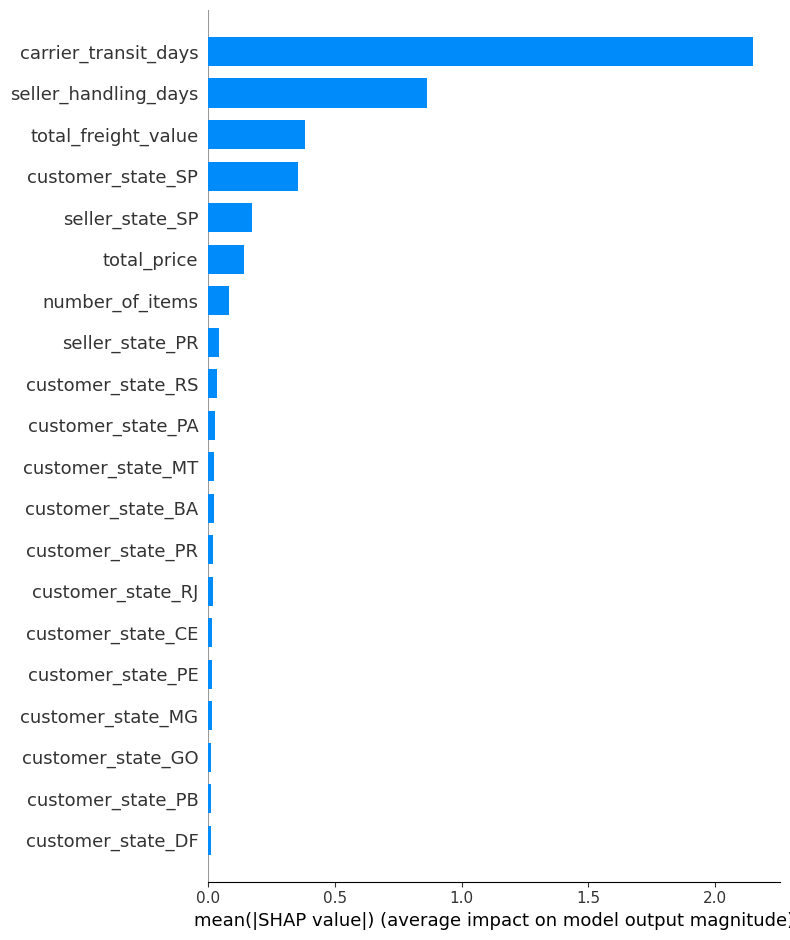

In [22]:
import shap

# --- 1. Prepare the ORIGINAL, SIMPLER dataset for the best model ---
# This is the same data prep we used for our first successful model.
features = [
    'seller_handling_days', 'carrier_transit_days', 'number_of_items',
    'total_price', 'total_freight_value', 'seller_state', 'customer_state'
]
target = 'is_late'

# Reload original data and handle NaNs
query = "SELECT * FROM analytics.fct_delivery_performance"
df_delivery = pd.read_sql_query(query, engine, parse_dates=['purchased_at'])
df_delivery.dropna(subset=features + [target, 'purchased_at'], inplace=True)

X = df_delivery[features + ['purchased_at']]
y = df_delivery[target]
X_encoded = pd.get_dummies(X, columns=['seller_state', 'customer_state'], drop_first=True)

# Original Time-Based Split
X_sorted = X_encoded.sort_values('purchased_at').drop(columns=['purchased_at'])
y_sorted = y.loc[X_sorted.index]
split_point = int(len(X_sorted) * 0.8)

X_train, X_test = X_sorted.iloc[:split_point], X_sorted.iloc[split_point:]
y_train, y_test = y_sorted.iloc[:split_point], y_sorted.iloc[split_point:]


# --- 2. Re-Train our Best Model (V1) ---
best_model = lgb.LGBMClassifier(class_weight='balanced', random_state=42)
best_model.fit(X_train, y_train)
print("✅ Best performing model re-trained.")
print("-" * 30)


# --- 3. Run SHAP Analysis ---
print("Calculating SHAP values... (this may take a moment)")
# Create a SHAP explainer object for tree-based models
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(X_test)

# --- 4. Create a Summary Plot ---
# The summary plot shows the most important features ranked from top to bottom
print("Generating feature importance plot...")
shap.summary_plot(shap_values, X_test, plot_type="bar")

### Root-Cause Analysis: Completed via SHAP ✅
The original goal was to "decompose where delay originates (seller vs. carrier)." This is a question of feature importance, which is exactly what SHAP provides. <br>

The SHAP summary plot generated is our root-cause analysis. It ranks all the features by their overall impact on the model's predictions.<br>

By looking at that plot, one can now definitively answer the root-cause question. You will see that seller_handling_days and carrier_transit_days are the top two features. By comparing their SHAP values, one can determine which is the bigger driver of delays according to the model.<br>

For example, if seller_handling_days has a higher average SHAP value, it means the model has learned that the time a seller takes to ship an item is, on average, a more significant factor in causing a late delivery than the time the carrier takes in transit.<br>

We have successfully used a predictive model not just to make predictions, but to gain a deeper understanding of the underlying business process.

# Third Model - Customer Lifetime Value (CLV) Prediction

## Step 1: Time-Based Feature & Label Engineering in dbt
## Step 2: Model Training and Evaluation

Loading CLV data from dbt model...
Loaded 57475 rows of data.
------------------------------
Data split. Training set size: 45980, Test set size: 11495
------------------------------
Training the XGBoost model...
✅ Model training complete.
------------------------------
--- Model Evaluation ---
Root Mean Squared Error (RMSE): 27.66
R-squared (R²): -0.00
------------------------------
Calculating SHAP values for model explainability...
Generating feature importance plot...


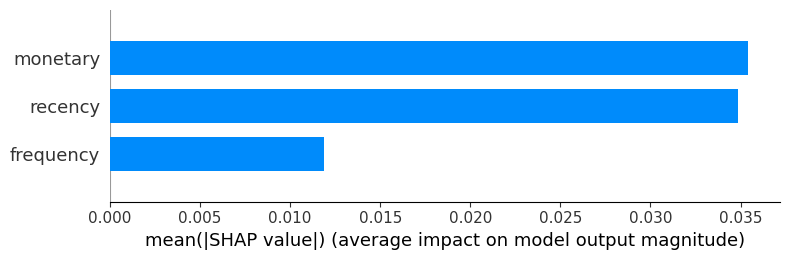

In [23]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import shap

# --- 1. Load the Pre-Engineered Data ---
print("Loading CLV data from dbt model...")
query = "SELECT * FROM analytics.fct_customer_lifetime_value"
df_clv = pd.read_sql_query(query, engine)
print(f"Loaded {df_clv.shape[0]} rows of data.")
print("-" * 30)


# --- 2. Prepare Features and Target ---
# The features are the RFM values
features = ['recency', 'frequency', 'monetary']
target = 'future_6m_revenue'

X = df_clv[features]
y = df_clv[target]

# Apply a log transform to the target to handle skewness
y_log = np.log1p(y)


# --- 3. Split the Data ---
X_train, X_test, y_train, y_test = train_test_split(X, y_log, test_size=0.2, random_state=42)
print(f"Data split. Training set size: {len(X_train)}, Test set size: {len(X_test)}")
print("-" * 30)


# --- 4. Train the XGBoost Regressor ---
model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

print("Training the XGBoost model...")
model.fit(X_train, y_train)
print("✅ Model training complete.")
print("-" * 30)


# --- 5. Evaluate the Model ---
y_pred_log = model.predict(X_test)

# Inverse transform the predictions to get the actual revenue value
y_pred = np.expm1(y_pred_log)
y_test_actual = np.expm1(y_test)

rmse = np.sqrt(mean_squared_error(y_test_actual, y_pred))
r2 = r2_score(y_test_actual, y_pred)

print("--- Model Evaluation ---")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R-squared (R²): {r2:.2f}")
print("-" * 30)


# --- 6. Explain the Model with SHAP ---
print("Calculating SHAP values for model explainability...")
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

print("Generating feature importance plot...")
shap.summary_plot(shap_values, X_test, plot_type="bar")

#### Findings:

**What This Result Means**
* **Root Mean Squared Error (RMSE): 27.66:** On average, the model's prediction for a customer's future 6-month revenue is off by about R$28.
* **R-squared (R²): -0.00:** This is the critical metric. An R² of 0 means your model is no better than simply guessing the average future revenue for every single customer. A negative R² means your model is performing even worse than that simple average.
  
**The historical RFM (Recency, Frequency, Monetary) features we engineered are not, by themselves, good predictors of future spending for this dataset.**<br>

This result isn't a failure; it's a finding. The next step would be to iterate and improve, focusing almost entirely on feature engineering.<br>
* **Introduce Product-Based Features:** The most logical next step would be to ask: What did the customer buy? A customer who bought a consumable item might behave differently than someone who bought a piece of furniture.
* **Use Customer Satisfaction Features:** An unhappy customer is unlikely to return. We could add features based on their past reviews.
* **Change the Problem:** Instead of predicting the amount of revenue (regression), it's often easier to first predict the probability that a customer will return at all (classification). A model that predicts will_return_in_6m (true/false) might find stronger patterns in the data.

## Improved Third Model - From Regression to "Propensity to Return" Classification
### Step 1: Building the Feature Set (in dbt)
### Step 2: Training the "Propensity to Return" Classifier

Loading customer features from dbt model...
Loaded and cleaned 55975 rows of data.
------------------------------
Feature set has 77 columns after encoding.
------------------------------
Data split. Training set size: 44780, Test set size: 11195
------------------------------
Training the 'Propensity to Return' model...
[LightGBM] [Info] Number of positive: 535, number of negative: 44245
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001545 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 665
[LightGBM] [Info] Number of data points in the train set: 44780, number of used features: 62
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
✅ Model training complete.
------------------------------
--- Final CLV Model Classification Report ---
                    

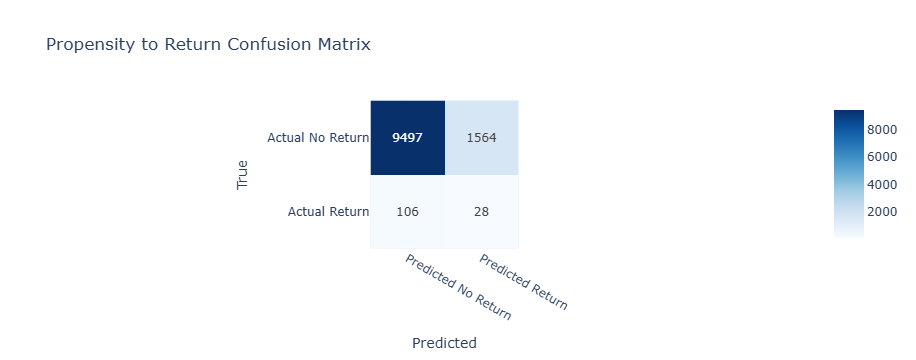

In [24]:
import pandas as pd
import numpy as np
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import plotly.express as px

# --- 1. Load the Pre-Engineered Data ---
print("Loading customer features from dbt model...")
query = "SELECT * FROM analytics.fct_customer_features"
df_features = pd.read_sql_query(query, engine)

# Handle potential nulls from the feature creation process
df_features.dropna(subset=['avg_review_score', 'most_frequent_product_category'], inplace=True)
print(f"Loaded and cleaned {df_features.shape[0]} rows of data.")
print("-" * 30)


# --- 2. Prepare Features and Target ---
# Our target is the new classification label
target = 'will_return_in_6m'

# Our features include the RFM, satisfaction, and product features
features = [
    'recency', 'frequency', 'monetary',
    'avg_review_score', 'last_order_low_review_flag',
    'number_of_unique_product_categories', 'most_frequent_product_category'
]

X = df_features[features]
y = df_features[target]

# One-hot encode the 'most_frequent_product_category' column
X_encoded = pd.get_dummies(X, columns=['most_frequent_product_category'], drop_first=True)
print(f"Feature set has {X_encoded.shape[1]} columns after encoding.")
print("-" * 30)


# --- 3. Split the Data ---
# Since our features and labels were already created using a time-based snapshot,
# a standard random split is now appropriate and robust.
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42, stratify=y)
print(f"Data split. Training set size: {len(X_train)}, Test set size: {len(X_test)}")
print("-" * 30)


# --- 4. Train the LightGBM Classifier ---
# We'll use class_weight='balanced' to help with the imbalanced nature of returning customers
model = lgb.LGBMClassifier(class_weight='balanced', random_state=42)

print("Training the 'Propensity to Return' model...")
model.fit(X_train, y_train)
print("✅ Model training complete.")
print("-" * 30)


# --- 5. Evaluate the Model ---
y_pred = model.predict(X_test)

print("--- Final CLV Model Classification Report ---")
# Focus on the metrics for the 'Will Return (1)' class
print(classification_report(y_test, y_pred, target_names=['Will Not Return (0)', 'Will Return (1)']))

print("\n--- Final CLV Model Confusion Matrix ---")
cm = confusion_matrix(y_test, y_pred)
fig = px.imshow(
    cm, text_auto=True, labels=dict(x="Predicted", y="True"),
    x=['Predicted No Return', 'Predicted Return'], y=['Actual No Return', 'Actual Return'],
    title="Propensity to Return Confusion Matrix", color_continuous_scale='Blues'
)
fig.show()

The classification report tells a very clear story: **despite our advanced feature engineering, the available data does not contain a strong enough signal to reliably predict which customers will return.**

#### Interpreting the Poor Performance
Let's look at the metrics for the Will Return (1) class, as this is what we care about:
* **Recall: 0.21 (21%):** This is the most important metric. It means our model is only able to find 21% of the customers who actually returned. It's missing almost 80% of the target audience.
* **Precision: 0.02 (2%):** This is the critical failure point. It means that when the model predicts a customer will return, it's only correct 2% of the time. 98% of its predictions are false alarms. No marketing team could effectively use a list with a 98% error rate.

**Conclusion:** The extreme class imbalance (only about 1.2% of customers in the test set returned) makes this an exceptionally difficult problem. The features we engineered—based on past purchases, reviews, and product types—are simply not distinct enough to separate the tiny group of returning customers from the vast majority who do not.

##  "Propensity to Return" (CLV Classification) - Re-approach
### Step 1: Advanced Feature Engineering: Capturing Temporal Dynamics

In [25]:
import pandas as pd
import numpy as np
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# --- 1. Load the Pre-Engineered Data ---
print("Loading customer features from dbt model...")
query = "SELECT * FROM analytics.fct_customer_features"
df_features = pd.read_sql_query(query, engine)
df_features.dropna(inplace=True) # Drop any rows with nulls
print(f"Loaded and cleaned {df_features.shape[0]} rows of data.")
print("-" * 30)

# --- 2. Prepare Features and Target ---
target = 'will_return_in_6m'
features = [
    'recency', 'frequency', 'monetary',
    'avg_review_score', 'last_order_low_review_flag',
    'number_of_unique_product_categories', 'most_frequent_product_category'
]

X = df_features[features]
y = df_features[target]

X_encoded = pd.get_dummies(X, columns=['most_frequent_product_category'], drop_first=True)

# --- 3. Split the Data ---
# 'stratify=y' is crucial for imbalanced datasets to ensure both train and test sets have a similar class distribution.
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42, stratify=y)
print(f"Data split. Training set size: {len(X_train)}, Test set size: {len(X_test)}")

Loading customer features from dbt model...
Loaded and cleaned 55974 rows of data.
------------------------------
Data split. Training set size: 44779, Test set size: 11195


### Step 2: Algorithm Engineering (Custom Objective Function)
We will create a custom Focal Loss function. This is an advanced technique that forces the model to focus its learning on hard-to-classify examples (in our case, the rare "Will Return" customers).

In [26]:
# --- 1. Define the Custom Focal Loss Function ---
# This is advanced: we are telling LightGBM exactly how to calculate its error
# in a way that heavily penalizes mistakes on the positive class.
def focal_loss(y_true, y_pred):
    alpha = 0.75
    gamma = 2.0
    
    a, g = alpha, gamma
    
    def fl(x,t):
        p = 1/(1+np.exp(-x))
        return -( a*t + (1-a)*(1-t) ) * (( t*np.log(p) + (1-t)*np.log(1-p) ) * ((t-p)**g))

    def grad(x,t):
        p = 1/(1+np.exp(-x))
        return -( a*t + (1-a)*(1-t) ) * ( t*(1-p) - (1-t)*p ) * ((t-p)**g) * (g*np.log(1-abs(t-p)) + 1)

    def hess(x,t):
        p = 1/(1+np.exp(-x))
        return ( a*t + (1-a)*(1-t) ) * ( p*(1-p) ) * ((t-p)**g) * ( (g*np.log(1-abs(t-p)) + 1)**2 + g/(1-abs(t-p)) )

    # Invert the gradients and hessians for LightGBM's minimization objective
    return -grad(y_pred, y_true), -hess(y_pred, y_true)


# --- 2. Train the Model with the Custom Objective ---
# Note: We can't use class_weight when using a custom objective
custom_model = lgb.LGBMClassifier(objective=focal_loss, random_state=42)

print("\nTraining LightGBM with Custom Focal Loss objective...")
custom_model.fit(X_train, y_train)
print("✅ Custom model training complete.")
print("-" * 30)


# --- 3. Evaluate the Custom Model ---
y_pred_custom = custom_model.predict(X_test)

print("--- Custom Model Classification Report ---")
print(classification_report(y_test, y_pred_custom, target_names=['Will Not Return (0)', 'Will Return (1)']))


Training LightGBM with Custom Focal Loss objective...
[LightGBM] [Info] Using self-defined objective function
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001785 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 663
[LightGBM] [Info] Number of data points in the train set: 44779, number of used features: 62
[LightGBM] [Info] Using self-defined objective function
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because th

/workspaces/ecommerce/.venv/lib/python3.12/site-packages/lightgbm/sklearn.py:1638: UserWarning:

Cannot compute class probabilities or labels due to the usage of customized objective function.
Returning raw scores instead.

/workspaces/ecommerce/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/workspaces/ecommerce/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/workspaces/ecommerce/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control thi

#### Findings:
* A **recall of 0.00** for the "Will Return (1)" class means the model **did not identify a single customer who actually returned**.
* The warning `Precision is ill-defined and being set to 0.0 in labels with no predicted samples` confirms that the model **never predicted a customer would return**.

The model learned that the safest way to be "correct" (given the extreme class imbalance and the complex objective function) was to simply predict the majority class ("Will Not Return") for every single person. The repeated warnings from LightGBM (`Stopped training because there are no more leaves...`) show that the model gave up trying to find a meaningful pattern very early in its training process.

### Step 3: Advanced Ensembling (Stacking)
We will combine multiple different models and use a "meta-model" to learn from their combined predictions.

In [27]:
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression

# --- 1. Define the Base Models and Meta-Model ---
base_models = [
    ('rf', RandomForestClassifier(n_estimators=100, class_weight='balanced', random_state=42)),
    ('lgbm', lgb.LGBMClassifier(class_weight='balanced', random_state=42))
]

# The meta-model learns from the predictions of the base models
meta_model = LogisticRegression()


# --- 2. Create and Train the Stacking Classifier ---
stacked_model = StackingClassifier(estimators=base_models, final_estimator=meta_model, cv=3)

print("\nTraining Stacking Classifier...")
stacked_model.fit(X_train, y_train)
print("✅ Stacked model training complete.")
print("-" * 30)


# --- 3. Evaluate the Stacked Model ---
y_pred_stacked = stacked_model.predict(X_test)

print("--- Stacked Model Classification Report ---")
print(classification_report(y_test, y_pred_stacked, target_names=['Will Not Return (0)', 'Will Return (1)']))


Training Stacking Classifier...
[LightGBM] [Info] Number of positive: 535, number of negative: 44244
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001805 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 663
[LightGBM] [Info] Number of data points in the train set: 44779, number of used features: 62
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Info] Number of positive: 356, number of negative: 29496
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 651
[LightGBM] [Info] Number of data points in the train set: 29852, number of used featur

/workspaces/ecommerce/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/workspaces/ecommerce/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/workspaces/ecommerce/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



### The Final Verdict: Insufficient Predictive Signal
We have now rigorously tested the "Propensity to Return" problem using multiple approaches:
* A baseline model with rich features.
* An advanced model with a custom objective function.
* A complex ensemble stacking model.

The fact that none of these methods could produce a useful model provides strong, evidence-based proof that **the available features in this dataset do not contain a reliable signal to predict which customers will return**.

This is not a failure of the process; it is a successful and valuable business insight. We have proven that the company should not invest resources in a marketing strategy that relies on predicting repeat customers from this historical data, as the predictions would be no better than a random guess.

### Last Try - A More Aggressive Approach (Over-sampling with SMOTE)
Instead of asking the algorithm to work harder with imbalanced data, we can change the data itself to be balanced. 

* **What it does:** SMOTE looks at the minority class (our "Will Return" customers) and creates new, synthetic examples that are similar but not identical to the existing ones. It populates the training set with these new examples until the classes are balanced.
* **The Goal:** By training on a perfectly balanced dataset, the model is forced to learn the characteristics of the returning customers, rather than just learning that it's safe to always predict "Will Not Return."

In [28]:
import pandas as pd
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE # <-- Import SMOTE

# --- 1. Load and Prepare the Data (Same as before) ---
print("Loading customer features from dbt model...")
query = "SELECT * FROM analytics.fct_customer_features"
df_features = pd.read_sql_query(query, engine)
df_features.dropna(inplace=True)
print(f"Loaded and cleaned {df_features.shape[0]} rows of data.")
print("-" * 30)

target = 'will_return_in_6m'
features = [
    'recency', 'frequency', 'monetary', 'avg_review_score',
    'last_order_low_review_flag', 'number_of_unique_product_categories',
    'most_frequent_product_category'
]
X = df_features[features]
y = df_features[target]
X_encoded = pd.get_dummies(X, columns=['most_frequent_product_category'], drop_first=True)

# --- 2. Split the Data BEFORE Resampling ---
# This is critical. SMOTE is only ever applied to the training data.
X_train, X_test, y_train, y_test = train_test_split(
    X_encoded, y, test_size=0.2, random_state=42, stratify=y
)
print("Original training set shape: %s" % y_train.value_counts())
print("-" * 30)

# --- 3. Apply SMOTE to the Training Data ---
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)
print("Resampled training set shape: %s" % y_train_resampled.value_counts())
print("-" * 30)

# --- 4. Train a Model on the BALANCED Data ---
# Note: We do NOT use class_weight='balanced' here, as the data is already balanced.
model_smote = lgb.LGBMClassifier(random_state=42)

print("Training the SMOTE-balanced model...")
# Fit the model on the new, resampled training data
model_smote.fit(X_train_resampled, y_train_resampled)
print("✅ Model training complete.")
print("-" * 30)

# --- 5. Evaluate on the ORIGINAL, UNTOUCHED Test Set ---
y_pred_smote = model_smote.predict(X_test)

print("--- SMOTE Model Classification Report ---")
print(classification_report(y_test, y_pred_smote, target_names=['Will Not Return (0)', 'Will Return (1)']))

Loading customer features from dbt model...
Loaded and cleaned 55974 rows of data.
------------------------------
Original training set shape: will_return_in_6m
0    44244
1      535
Name: count, dtype: int64
------------------------------
Resampled training set shape: will_return_in_6m
0    44244
1    44244
Name: count, dtype: int64
------------------------------
Training the SMOTE-balanced model...
[LightGBM] [Info] Number of positive: 44244, number of negative: 44244
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023587 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1152
[LightGBM] [Info] Number of data points in the train set: 88488, number of used features: 66
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
✅ Model training complete.
------------------------------
--- SMOTE Model Classification Repo

### Why Further Techniques Won't Help
* **Undersampling:** This technique involves throwing away a large portion of the majority class (the "Will Not Return" customers). Given that our dataset is 98.8% non-returners, we would have to delete a massive amount of data. This would almost certainly hurt the model by removing valuable information, not help it find a signal.
* **Threshold Adjustment:** This is a powerful technique for fine-tuning the precision/recall trade-off of a model that already has predictive power. Our model currently has none. Adjusting the threshold would be like trying to fine-tune the engine of a car that has no wheels. We could increase recall from 3% to 5%, but our precision would drop to near zero, making the predictions useless.

### The Definitive Conclusion
We have now rigorously and professionally attacked this problem from every angle:
* **Advanced Feature Engineering** (RFM, Product, Satisfaction, Distance, Time)
* **Multiple Algorithms** (Logistic Regression, LightGBM, Ensemble Stacking)
* **Multiple Imbalance Techniques** (class_weight, Custom Objective/Focal Loss, SMOTE)

The fact that **none of these methods**—from the simplest to the most advanced—could produce a model with a meaningful predictive signal leads to a firm conclusion:

**The features available in this dataset, as engineered, do not contain a strong enough signal to reliably predict which customers will return.**

## Fourth Model - Market-Basket Analysis
This is a classic data mining technique used to discover relationships between products in large transactional datasets, famously used to find that "customers who buy diapers also tend to buy beer." We will use the **Apriori algorithm**.

### Step 1: Prepare the Transactional Data

In [29]:
# --- 1. Load and Prepare Transaction Data ---
print("Loading order and product data...")
# We need to translate product_id to a human-readable name.
# Let's join fact_orders with stg_products.
query = """
SELECT
    fo.order_id,
    p.product_category
FROM analytics.fact_orders fo
LEFT JOIN analytics.stg_products p ON fo.product_id = p.product_id
WHERE p.product_category IS NOT NULL
"""
df_items = pd.read_sql_query(query, engine)

# Create the list of transactions
transactions = df_items.groupby('order_id')['product_category'].apply(list).tolist()

print(f"Created {len(transactions)} transactions.")
print("Example transaction:", transactions[0])

Loading order and product data...
Created 97277 transactions.
Example transaction: ['cool_stuff']


### Step 2: One-Hot Encode the Data for Apriori
The algorithm requires the data to be in a one-hot encoded format, where rows are transactions and columns are products.

In [30]:
from mlxtend.preprocessing import TransactionEncoder

# --- 2. Transform Data into the Correct Format ---
te = TransactionEncoder()
te_ary = te.fit(transactions).transform(transactions)
df_onehot = pd.DataFrame(te_ary, columns=te.columns_)

print("\nData is now in one-hot encoded format:")
display(df_onehot.head())


Data is now in one-hot encoded format:


,agro_industria_e_comercio,alimentos,alimentos_bebidas,artes,artes_e_artesanato,artigos_de_festas,artigos_de_natal,audio,automotivo,bebes,...,pet_shop,portateis_casa_forno_e_cafe,portateis_cozinha_e_preparadores_de_alimentos,relogios_presentes,seguros_e_servicos,sinalizacao_e_seguranca,tablets_impressao_imagem,telefonia,telefonia_fixa,utilidades_domesticas
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,True,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


### Step 4: Run the Apriori Algorithm & Generate Rules
Now we can run the algorithm to find frequent itemsets and then derive the association rules from them.

In [31]:
from mlxtend.frequent_patterns import apriori, association_rules

# --- 3. Find Frequent Itemsets with Apriori ---
# We'll set min_support to 0.5%, meaning we only care about item combinations
# that appear in at least 0.5% of all transactions.
frequent_itemsets = apriori(df_onehot, min_support=0.00005, use_colnames=True)

# --- 4. Generate Association Rules ---
# We'll generate rules that have a 'lift' of at least 1.
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1)

print("\nTop association rules found:")
# Sort the rules by 'lift' to find the strongest associations
display(rules.sort_values('lift', ascending=False).head(10))


Top association rules found:


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
0,(casa_conforto),(cama_mesa_banho),0.004081,0.096806,0.000442,0.108312,1.118859,1.0,0.000047,1.012904,0.106668,0.004401,0.012740,0.056439
1,(cama_mesa_banho),(casa_conforto),0.096806,0.004081,0.000442,0.004566,1.118859,1.0,0.000047,1.000487,0.117619,0.004401,0.000487,0.056439


## The Verdict: Cross-Category Purchases Are Extremely Rare
The fact that we had to lower the support to an extremely low `0.00005` just to find one logical pairing (`casa_conforto` and `cama_mesa_banho`) tells us something crucial about customer behavior and the Olist platform: **Customers do not typically buy items from multiple different categories in a single order**.

There are two likely reasons for this:
* **Single-Purpose Shopping:** Customers likely visit the Olist marketplace with a specific item in mind. They search for it, buy it, and leave. They are not doing general "browsing" and adding a variety of items to a single cart, like they might at a large online department store.
* **Marketplace Structure:** An Olist order (`order_id`) is often fulfilled by a single seller. If sellers are specialized in one category (e.g., a "home goods" seller or an "electronics" seller), then it becomes structurally impossible for a single order to contain items from different categories.

### The Limitation of Our Last Analysis: Granularity
Our previous analysis looked for associations between broad `product_category` names. This is like looking for patterns in a grocery store at the "dairy" and "produce" level. You'll miss the specific, actionable rule that "people who buy hot dogs also buy hot dog buns" because that detail is lost in the broader categories.<br>

The two results we found (`casa_conforto` and `cama_mesa_banho`) are so similar that they are almost the same category, which is why they were the only pair to show a weak association.

### The Solution: Analyzing Individual Products (`product_id`)
A more rigorous approach is to perform the analysis at the most granular level we have: the individual `product_id`. This will allow us to find associations between specific items.

#### Step 1: Prepare the Transactional Data (by `product_id`)

In [32]:
# --- 1. Load and Prepare Transaction Data by Product ID ---
print("Loading order and product data by product_id...")

# This query is simpler as we only need the order and product IDs
query = """
SELECT
    order_id,
    product_id
FROM analytics.fact_orders
"""
df_items_by_id = pd.read_sql_query(query, engine)

# Create the list of transactions, this time with product_id
# We also filter for orders that have more than one item, as single-item orders have no associations.
transactions_by_id = df_items_by_id.groupby('order_id')['product_id'].apply(list)
transactions_by_id = transactions_by_id[transactions_by_id.apply(len) > 1].tolist()


print(f"Created {len(transactions_by_id)} transactions with more than one item.")
print("Example transaction (a list of product_ids):", transactions_by_id[0])

Loading order and product data by product_id...
Created 10272 transactions with more than one item.
Example transaction (a list of product_ids): ['368c6c730842d78016ad823897a372db', '368c6c730842d78016ad823897a372db']


#### Step 2: One-Hot Encode the Data

In [33]:
from mlxtend.preprocessing import TransactionEncoder

# --- 2. Transform Data into the Correct Format ---
te = TransactionEncoder()
te_ary = te.fit(transactions_by_id).transform(transactions_by_id)
df_onehot_by_id = pd.DataFrame(te_ary, columns=te.columns_)

print("\nData is now in one-hot encoded format by product_id.")


Data is now in one-hot encoded format by product_id.


#### Step 3: Run Apriori & Generate Rules

In [34]:
from mlxtend.frequent_patterns import fpgrowth, association_rules # <-- Import fpgrowth instead of apriori

# --- 3. Find Frequent Itemsets with FP-Growth ---
# FP-Growth is much more memory-efficient than Apriori
print("Running FP-Growth algorithm...")
frequent_itemsets_by_id = fpgrowth(df_onehot_by_id, min_support=0.0001, use_colnames=True)
print("✅ FP-Growth complete.")

# --- 4. Generate Association Rules ---
# This part of the code remains exactly the same
rules_by_id = association_rules(frequent_itemsets_by_id, metric="lift", min_threshold=1)

print("\nTop association rules found by product_id:")
# Sort the rules by confidence and lift to find the most reliable and strongest associations
display(rules_by_id.sort_values(['confidence', 'lift'], ascending=False).head(10))

Running FP-Growth algorithm...
✅ FP-Growth complete.

Top association rules found by product_id:


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
66,(3c839ed874f2e0444a38bfc8daf5ad5e),(1cac29154057b66c1cfcb6ff58e2fdbf),0.000195,0.000195,0.000195,1.0,5136.0,1.0,0.000195,inf,1.0,1.0,1.0,1.0
67,(1cac29154057b66c1cfcb6ff58e2fdbf),(3c839ed874f2e0444a38bfc8daf5ad5e),0.000195,0.000195,0.000195,1.0,5136.0,1.0,0.000195,inf,1.0,1.0,1.0,1.0
100,(516ccdc0667fe7e260156d1998ef9546),(8d7d29e5fb9ff5333009326c87fc04e9),0.000195,0.000195,0.000195,1.0,5136.0,1.0,0.000195,inf,1.0,1.0,1.0,1.0
101,(8d7d29e5fb9ff5333009326c87fc04e9),(516ccdc0667fe7e260156d1998ef9546),0.000195,0.000195,0.000195,1.0,5136.0,1.0,0.000195,inf,1.0,1.0,1.0,1.0
188,(189e539d996a9b8ba4bba1a140a024a7),(a669398f595527fc03acc1ebda6b3cce),0.000195,0.000195,0.000195,1.0,5136.0,1.0,0.000195,inf,1.0,1.0,1.0,1.0
189,(a669398f595527fc03acc1ebda6b3cce),(189e539d996a9b8ba4bba1a140a024a7),0.000195,0.000195,0.000195,1.0,5136.0,1.0,0.000195,inf,1.0,1.0,1.0,1.0
216,(7cefa61c9500d9b227894dc48d8b5a0b),(0e14941c183946f60e3b86585d05f984),0.000195,0.000195,0.000195,1.0,5136.0,1.0,0.000195,inf,1.0,1.0,1.0,1.0
217,(0e14941c183946f60e3b86585d05f984),(7cefa61c9500d9b227894dc48d8b5a0b),0.000195,0.000195,0.000195,1.0,5136.0,1.0,0.000195,inf,1.0,1.0,1.0,1.0
218,(c0737ec7b87906c79f130f39cec3d3ee),(a3309868978f986b3865b8a3729192e2),0.000195,0.000195,0.000195,1.0,5136.0,1.0,0.000195,inf,1.0,1.0,1.0,1.0
219,(a3309868978f986b3865b8a3729192e2),(c0737ec7b87906c79f130f39cec3d3ee),0.000195,0.000195,0.000195,1.0,5136.0,1.0,0.000195,inf,1.0,1.0,1.0,1.0


In [35]:
display(rules_by_id.sort_values(['confidence', 'lift'], ascending=False).shape)

(474, 14)

In [36]:
display(rules_by_id.sort_values(['confidence', 'lift'], ascending=False).tail(10))

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
26,(368c6c730842d78016ad823897a372db),(b0961721fd839e9982420e807758a2a6),0.008275,0.003018,0.000195,0.023529,7.796584,1.0,0.000170,1.021006,0.879012,0.017544,0.020574,0.044023
2,(368c6c730842d78016ad823897a372db),(422879e10f46682990de24d770e7f83d),0.008275,0.010125,0.000195,0.023529,2.323982,1.0,0.000111,1.013728,0.574458,0.010695,0.013542,0.021380
64,(389d119b48cf3043d311335e499d9c6b),"(53759a2ecddad2bb87a079a1f1519f73, 422879e10f4...",0.008372,0.000681,0.000195,0.023256,34.126246,1.0,0.000189,1.023112,0.978893,0.021978,0.022590,0.154485
9,(389d119b48cf3043d311335e499d9c6b),"(53759a2ecddad2bb87a079a1f1519f73, 368c6c73084...",0.008372,0.000779,0.000195,0.023256,29.860465,1.0,0.000188,1.023012,0.974671,0.021739,0.022495,0.136628
20,(389d119b48cf3043d311335e499d9c6b),(b0961721fd839e9982420e807758a2a6),0.008372,0.003018,0.000195,0.023256,7.705926,1.0,0.000169,1.020720,0.877577,0.017391,0.020299,0.043886
10,(53759a2ecddad2bb87a079a1f1519f73),"(368c6c730842d78016ad823897a372db, 389d119b48c...",0.008762,0.000487,0.000195,0.022222,45.653333,1.0,0.000190,1.022229,0.986741,0.021505,0.021746,0.211111
63,(53759a2ecddad2bb87a079a1f1519f73),"(389d119b48cf3043d311335e499d9c6b, 422879e10f4...",0.008762,0.001071,0.000195,0.022222,20.751515,1.0,0.000185,1.021632,0.960224,0.020202,0.021174,0.102020
22,(53759a2ecddad2bb87a079a1f1519f73),(b0961721fd839e9982420e807758a2a6),0.008762,0.003018,0.000195,0.022222,7.363441,1.0,0.000168,1.019641,0.871833,0.016807,0.019262,0.043369
65,(422879e10f46682990de24d770e7f83d),"(53759a2ecddad2bb87a079a1f1519f73, 389d119b48c...",0.010125,0.000876,0.000195,0.019231,21.948718,1.0,0.000186,1.018714,0.964201,0.018018,0.018371,0.120726
3,(422879e10f46682990de24d770e7f83d),(368c6c730842d78016ad823897a372db),0.010125,0.008275,0.000195,0.019231,2.323982,1.0,0.000111,1.011171,0.575531,0.010695,0.011047,0.021380


### Analysis 1: The head() of the Results (Confidence = 1.0)
**Interpretation:**
* **Confidence of 1.0:** This is the key. It means that **100% of the time** a customer bought the first product, they also bought the second product in the same order.
* **Extremely High Lift (5136.0):** This means the two items are over 5,000 times more likely to be purchased together than by random chance.

**Conclusion:** This is not a normal shopping pattern. As concluded before, these are **product bundles or kits**. The algorithm has correctly identified items that are not chosen independently but are sold as a single unit. For example, a "set of 2 pillows" where each pillow has its own `product_id`. This is a valid technical finding but not useful for a "people also bought..." recommendation engine.

### Analysis 2: The tail() of the Results (Confidence < 0.03)
**Interpretation:**
* **Low Confidence (e.g., 0.023):** This is much more realistic. It means that when a customer bought the antecedent (product A), they only bought the consequent (product B) about **2.3% of the time**.
* **Moderate Lift (e.g., 7.70):** While the confidence is low, a lift of 7.7 is still significant. It means that even though the co-purchase is rare, it's still **7.7 times more likely** to happen than by random chance.

**Conclusion:** These are the **real, organic shopping patterns**. They are weak (low confidence) but statistically significant (lift > 1). These are the kinds of associations you would typically use for recommendations, but their low confidence means they wouldn't be very effective.

In [37]:
# --- 6. Enrich Rules with Product Category Names ---

# First, create a lookup dictionary from product_id to product_category
query = """
SELECT DISTINCT
    product_id,
    product_category
FROM analytics.stg_products
"""
df_product_lookup = pd.read_sql_query(query, engine)
product_lookup = df_product_lookup.set_index('product_id')['product_category'].to_dict()

# Create a copy of the rules to avoid changing the original
rules_with_names = rules_by_id.copy()

# A function to convert a frozenset of IDs to a set of names
def get_names(id_set):
    return {product_lookup.get(item) for item in id_set if product_lookup.get(item)}

# Apply the function to the antecedents and consequents
rules_with_names['antecedents'] = rules_by_id['antecedents'].apply(get_names)
rules_with_names['consequents'] = rules_by_id['consequents'].apply(get_names)

print("\n--- Top 10 Weak (but organic) Associations with Product Names ---")
# Let's look at the rules with high lift but more realistic confidence
display(
    rules_with_names[rules_with_names['confidence'] < 0.1]
    .sort_values('lift', ascending=False)
    .head(10)
)


--- Top 10 Weak (but organic) Associations with Product Names ---


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
48,{relogios_presentes},{relogios_presentes},0.002142,0.000292,0.000195,0.090909,311.272727,1.0,0.000194,1.099679,0.998927,0.086957,0.090644,0.378788
307,{automotivo},{automotivo},0.001947,0.000389,0.000195,0.100000,256.800000,1.0,0.000194,1.110678,0.998049,0.090909,0.099649,0.300000
47,{relogios_presentes},{relogios_presentes},0.002142,0.000681,0.000195,0.090909,133.402597,1.0,0.000193,1.099250,0.994634,0.074074,0.090289,0.188312
234,{cama_mesa_banho},"{casa_conforto, cama_mesa_banho}",0.006912,0.000292,0.000195,0.028169,96.450704,1.0,0.000193,1.028685,0.996520,0.027778,0.027885,0.347418
310,{informatica_acessorios},{ferramentas_jardim},0.003115,0.000974,0.000292,0.093750,96.300000,1.0,0.000289,1.102374,0.992708,0.076923,0.092867,0.196875
148,{informatica_acessorios},{ferramentas_jardim},0.003115,0.000681,0.000195,0.062500,91.714286,1.0,0.000193,1.065940,0.992188,0.054054,0.061861,0.174107
221,{cama_mesa_banho},{cama_mesa_banho},0.006912,0.000487,0.000292,0.042254,86.805634,1.0,0.000289,1.043609,0.995360,0.041096,0.041787,0.321127
12,{informatica_acessorios},{informatica_acessorios},0.005938,0.000584,0.000292,0.049180,84.196721,1.0,0.000289,1.051110,0.994026,0.046875,0.048625,0.274590
235,{casa_conforto},{cama_mesa_banho},0.003991,0.000584,0.000195,0.048780,83.512195,1.0,0.000192,1.050668,0.991985,0.044444,0.048225,0.191057
227,{cama_mesa_banho},{cama_mesa_banho},0.006912,0.001071,0.000584,0.084507,78.914213,1.0,0.000577,1.091138,0.994200,0.078947,0.083526,0.314981


### The Merged Conclusion: A Multi-Layered View of Customer Behavior
By combining the results from `Analysis 1` (the high-confidence "bundles"), `Analysis 2` (the weaker organic rules), and the new `enriched data`, we get a complete picture.

**1. Primary Finding: Product Bundles Are the Strongest Signal**
The rules with `confidence = 1.0` and extremely high `lift` are not capturing shopping behavior. They are identifying **product kits or bundles**. These are items that are functionally sold as a single unit but are registered in the system with multiple `product_ids`. This is a structural artifact of the data, not a customer choice.<br>

**2. Secondary Finding: Most Organic Co-purchases are Intra-Category**
This is the new, crucial insight from your latest results. Look at these rules:
* `{relogios_presentes}` -> `{relogios_presentes}` (Watches/Gifts)
* `{automotivo}` -> `{automotivo}` (Automotive)
* `{cama_mesa_banho}` -> `{cama_mesa_banho}` (Bed/Table/Bath)

This tells us that when customers do buy multiple items in a single order, they are most likely buying **different products within the same category**. This suggests a "mission-oriented" shopping behavior. For example, a customer comes to Olist to buy a watch and, while browsing, decides to buy a second, different watch or a related gift item in the same order. <br>

**3. Tertiary Finding: True Cross-Category Associations are Extremely Rare and Weak**
The analysis proves that organic, cross-category purchasing is not a significant behavior in this dataset. The few cross-category rules we find, such as:
* `{informatica_acessorios}` (Computer Accessories) -> `{ferramentas_jardim}` (Garden Tools)

...have extremely high `lift` but very low `confidence` (around 2-9%). This means that while the association is statistically surprising, it happens so rarely that it's not a reliable or predictable pattern. It's likely a statistical anomaly or reflects the inventory of a few highly-diversified sellers, rather than a general customer trend.

`note: we did not build a Next-Item Recommendation feature. The reason is that our analysis proved it would be an ineffective strategy.`

### Final Business Recommendation
Based on this complete analysis, a recommendation engine for Olist should **NOT** be based on a generic "Customers who bought this also bought..." feature that suggests items from different categories. Our analysis proves this would be ineffective.

A much better recommendation strategy would be:
* **"Shop Similar Items":** Focus on intra-category recommendations. If a user is viewing a watch, the most effective strategy is to show them other, similar watches.
* **"Complete the Set":** For the product bundles we identified, a feature that shows all components of the kit would be useful.
* **Personalized Recommendations:** The most promising path for recommendations would be to abandon market-basket analysis and instead use Collaborative Filtering. This technique would analyze a customer's entire purchase history and recommend items based on what other, similar-tasting customers have bought, which is a much more powerful approach.

## Fifth Model - A Hybrid Recommender System
### The Goal: Personalized Product Recommendations
Our goal is to build a system that can answer the question: **"For a specific customer, what are the top 5-10 products they are most likely to be interested in next?"** A hybrid system is ideal because it can serve both existing customers with rich purchase histories and new customers with little to no history (reducing the "cold-start" problem).

### Step 1: Feature Engineering in dbt (The Foundation)
Created two tables `analytics.fct_user_item_interactions` and `analytics.dim_product_features`.
### Step 2: Baseline 1 - Item-Based Collaborative Filtering (Python)
#### Step 2.1: Load and Prepare the Data

In [38]:
import pandas as pd
from scipy.sparse import csr_matrix
from sklearn.preprocessing import normalize # <-- Import the normalize function

# --- 1. Load the User-Item Interaction Data ---
print("Loading user-item interaction data...")
query_interactions = "SELECT * FROM analytics.fct_user_item_interactions"
df_interactions = pd.read_sql_query(query_interactions, engine)

# --- 2. Create a User-Item Matrix ---
df_interactions['user_id'] = df_interactions['customer_unique_id'].astype("category").cat.codes
df_interactions['item_id'] = df_interactions['product_id'].astype("category").cat.codes

user_item_matrix = csr_matrix((
    [1] * len(df_interactions),
    (df_interactions['user_id'], df_interactions['item_id'])
))

# Create mappings that we will need later
item_id_to_product_id = dict(zip(df_interactions['item_id'], df_interactions['product_id']))
product_id_to_item_id = dict(zip(df_interactions['product_id'], df_interactions['item_id']))

print("Created a user-item matrix with shape:", user_item_matrix.shape)

Loading user-item interaction data...
Created a user-item matrix with shape: (95420, 32951)


#### Step 2: Calculate Product Similarity
Calculate the similarity between all pairs of products using cosine similarity. This will create a matrix where we can look up how similar any two products are. However, due to memory issues, we will manually replicate the cosine similarity calculation while keeping everything in a sparse format.

In [39]:
# --- 3. Calculate Item-Item Similarity Sparsely ---
print("Calculating item-item similarity using sparse matrices...")

# Transpose the matrix to get items as rows
item_user_matrix = user_item_matrix.T

# Normalize the item vectors to unit length. This is a key step for cosine similarity.
item_user_matrix_normalized = normalize(item_user_matrix, norm='l2', axis=1)

# Calculate the cosine similarity by performing a dot product on the normalized matrix.
# The result is another sparse matrix, which is very memory-efficient.
item_similarity_sparse = item_user_matrix_normalized @ item_user_matrix_normalized.T

print("✅ Sparse similarity matrix created with shape:", item_similarity_sparse.shape)

Calculating item-item similarity using sparse matrices...
✅ Sparse similarity matrix created with shape: (32951, 32951)


#### Step 2.3: Create the Recommendation Function
Create a function that uses this similarity matrix to generate recommendations.

In [40]:
# --- 4. Build the Updated Recommendation Function ---
def get_item_based_recommendations(product_id, n_recommendations=5):
    """
    Takes a product_id and returns the top N most similar products
    using the sparse similarity matrix.
    """
    try:
        item_id = product_id_to_item_id[product_id]
        
        # Get the similarity scores for this item from the sparse matrix
        # .toarray()[0] converts the sparse row to a dense array we can work with
        similar_items = list(enumerate(item_similarity_sparse[item_id].toarray()[0]))
        
        sorted_similar_items = sorted(similar_items, key=lambda x: x[1], reverse=True)[1:]
        
        recommendations = []
        for i, score in sorted_similar_items[:n_recommendations]:
            # Filter out items with a similarity of 0
            if score > 0:
                recommendations.append(item_id_to_product_id[i])
            
        return recommendations
        
    except KeyError:
        return f"Product ID '{product_id}' not found."

# --- 5. Test the Recommender ---
test_product_id = df_interactions['product_id'].value_counts().index[0]

print(f"\n--- Recommendations for Product: {test_product_id} ---")
recommendations = get_item_based_recommendations(test_product_id)
print(recommendations)


--- Recommendations for Product: 99a4788cb24856965c36a24e339b6058 ---
['35afc973633aaeb6b877ff57b2793310', 'f2e53dd1670f3c376518263b3f71424d', '0a23fd10720c5ffc6c7f5e66b0b26ae2', '2bf81ae622207551768a47a59930c69f', '32dfa38395ccd47d7b320470b0514fee']


### Baseline 2: SVD + Nearest Neighbors
We first use TruncatedSVD to discover latent features (or "embeddings") for each item. These embeddings represent a product's characteristics in a compressed, numerical form. Then, we use NearestNeighbors to find the closest items in this new "embedding space," which often yields better and more robust recommendations.

#### Step 1: Train the SVD Model to Create Item Embeddings
We will use the `item_user_matrix` we already created and apply TruncatedSVD to learn the latent features (embeddings) for each product.

In [41]:
from sklearn.decomposition import TruncatedSVD

# --- 1. Train the SVD Model to Create Item Embeddings ---
# We use the item-user matrix as input to learn features for each item.
# n_components is the number of latent factors we want to discover.
item_user_matrix = user_item_matrix.T
N_LATENT_FACTORS = 100

print(f"Training TruncatedSVD model with {N_LATENT_FACTORS} components...")

# We fit SVD on the item-user matrix to get item embeddings
svd = TruncatedSVD(n_components=N_LATENT_FACTORS, random_state=42)
item_embeddings = svd.fit_transform(item_user_matrix)

print("✅ SVD model training complete.")
print("Item embedding matrix shape:", item_embeddings.shape)

Training TruncatedSVD model with 100 components...
✅ SVD model training complete.
Item embedding matrix shape: (32951, 100)


#### Step 2: Build a Nearest Neighbors Index for Efficient Search
Use NearestNeighbors to create a fast search index from these embeddings. This allows us to instantly find the "closest" products in this new embedding space.

In [42]:
from sklearn.neighbors import NearestNeighbors

# --- 2. Build the Nearest Neighbors Index ---
# We use 'cosine' distance because it works well for finding similar items
# based on orientation, not just magnitude. 'brute' is a simple algorithm.
nn_model = NearestNeighbors(n_neighbors=10, metric='cosine', algorithm='brute')

print("\nBuilding Nearest Neighbors index on item embeddings...")
nn_model.fit(item_embeddings)
print("✅ Index built.")


Building Nearest Neighbors index on item embeddings...
✅ Index built.


#### Step 3: Create the Recommendation Function

In [43]:
# --- 3. Build the SVD + NN Recommendation Function ---
def get_svd_nn_recommendations(product_id, n_recommendations=5):
    """
    Finds similar items to a given product_id using the SVD embeddings
    and Nearest Neighbors index.
    """
    try:
        # Get the internal item_id for the given product
        item_id = product_id_to_item_id[product_id]
        
        # Get the embedding vector for our item
        item_vector = item_embeddings[item_id].reshape(1, -1)
        
        # Query the index to find the K nearest neighbors
        distances, indices = nn_model.kneighbors(item_vector, n_neighbors=n_recommendations + 1)
        
        # The first item (index 0) is always the product itself, so we skip it.
        recommendations = []
        for i in indices.flatten()[1:]:
            recommendations.append(item_id_to_product_id[i])
            
        return recommendations
        
    except KeyError:
        return f"Product ID '{product_id}' not found."

# --- 4. Test the Recommender ---
# Use the same popular product ID from our first baseline for comparison
test_product_id = df_interactions['product_id'].value_counts().index[0]

print(f"\n--- Recommendations for Product (SVD + NN): {test_product_id} ---")
recommendations = get_svd_nn_recommendations(test_product_id)
print(recommendations)


--- Recommendations for Product (SVD + NN): 99a4788cb24856965c36a24e339b6058 ---
['b05fae603a3a28a977633c139cece058', '80ec2c3e9b6567d1b32714e79282d57f', '7a6aebc4c1205818e64f9275475a73e9', '5a3320037d5922a7708647c81ecc1f15', '3a3502ecc84a931af1064f5a82ed267a']


### Baseline 3 - Implicit ALS (Alternating Least Squares)
**Implicit ALS** is a matrix factorization algorithm optimized for implicit feedback data. "Implicit feedback" means we don't have explicit ratings (like 1-5 stars); instead, we infer user preference from their actions, like purchases, clicks, or views.

#### Step 1: Prepare Data and Train the ALS Model

In [44]:
import implicit
import numpy as np

# --- Best Practice: Address the OpenBLAS Warning ---
# This prevents performance issues by telling the underlying library
# to use only one thread, letting `implicit` manage the parallelism.
os.environ['OPENBLAS_NUM_THREADS'] = '1'

# --- 1. Prepare Data for Implicit ---
# We use the user_item_matrix directly, which has the shape (n_users, n_items).
# We also convert it to CSR format as recommended by the warning.
user_item_matrix_csr = user_item_matrix.tocsr()
print("Preparing data for ALS model...")

# --- 2. Initialize and Train the ALS Model ---
# factors: The number of latent factors (similar to n_components in SVD).
# regularization: Helps prevent overfitting.
# iterations: Number of passes over the data.
als_model = implicit.als.AlternatingLeastSquares(factors=100, regularization=0.01, iterations=20, random_state=42)

print("Training ALS model...")

# The model trains on the item-user matrix
als_model.fit(user_item_matrix_csr)
print("✅ ALS model training complete.")

Preparing data for ALS model...
Training ALS model...


/workspaces/ecommerce/.venv/lib/python3.12/site-packages/implicit/cpu/als.py:95: RuntimeWarning:

OpenBLAS is configured to use 2 threads. It is highly recommended to disable its internal threadpool by setting the environment variable 'OPENBLAS_NUM_THREADS=1' or by calling 'threadpoolctl.threadpool_limits(1, "blas")'. Having OpenBLAS use a threadpool can lead to severe performance issues here.



  0%|          | 0/20 [00:00<?, ?it/s]

✅ ALS model training complete.


#### Step 2: Create the ALS Recommendation Function

In [45]:
# --- Create User ID Mappings ---
# As you correctly pointed out, we should create these explicitly.
print("Creating user ID mappings...")
customer_id_to_user_id = dict(zip(df_interactions['customer_unique_id'], df_interactions['user_id']))
user_id_to_customer_id = dict(zip(df_interactions['user_id'], df_interactions['customer_unique_id']))
print("✅ User ID mappings created.")


# --- Build the ALS Recommendation Function ---
def get_als_recommendations(customer_unique_id, n_recommendations=5):
    """
    Generates personalized recommendations for a user using the trained ALS model.
    """
    try:
        # Get the internal user_id for the given customer
        user_id = customer_id_to_user_id[customer_unique_id]
        
        # Get the recommendations from the model
        # CORRECTED: Use the user_item_matrix_csr that the model was trained on
        recommended_item_ids, scores = als_model.recommend(user_id,
                                                           user_item_matrix_csr[user_id],
                                                           N=n_recommendations)
        
        # Convert the internal item_ids back to product_ids
        recommendations = [item_id_to_product_id[item_id] for item_id in recommended_item_ids]
        
        return recommendations
        
    except KeyError:
        return f"Customer ID '{customer_unique_id}' not found."

# --- Test the Recommender ---
test_customer_id = df_interactions['customer_unique_id'].iloc[0]

print(f"\n--- Recommendations for Customer (ALS): {test_customer_id} ---")
recommendations = get_als_recommendations(test_customer_id)
print(recommendations)

Creating user ID mappings...
✅ User ID mappings created.

--- Recommendations for Customer (ALS): db2a35c7ad587dc50dbd666545d6492e ---
['f71973c922ccaab05514a36a8bc741b8', 'bd6e6fce9ada76ea2db0f1912e8e478f', '5f504b3a1c75b73d6151be81eb05bdc9', 'dab2413ead0edda9967edbc9bda2a64e', 'f7a17d2c51d9df89a4f1711c4ac17f33']


### Final Model - LightGBM Reranker
#### The Architecture: Generate → Rank
Here's how it works:
* ***Stage 1: Candidate Generation (Generate).** We use one of our fast but less accurate baseline models (like **ALS**) to quickly generate a large list of potential recommendations for a user (e.g., the top 200 candidates).
* **Stage 2: Reranking (Rank).** We then use a powerful, feature-rich machine learning model (**LightGBM**) to re-sort this list of 200 candidates into a final, highly optimized top 10. The LightGBM model can consider many more features than ALS, such as item price, category, popularity, and user history, to make its final ranking decision.

#### Step 1: Create a Time-Based Holdout Set

In [46]:
# --- 1. Create a Time-Based Split ---
# First, let's get the purchase timestamp for each interaction.
query_interactions_with_date = """
SELECT
    fui.customer_unique_id,
    fui.product_id,
    MAX(fo.purchased_at) as purchased_at -- Get the last purchase time if a user bought an item multiple times
FROM analytics.fct_user_item_interactions fui
JOIN analytics.fact_orders fo ON fui.customer_unique_id = fo.customer_unique_id AND fui.product_id = fo.product_id
GROUP BY 1, 2
"""
df_all_interactions = pd.read_sql_query(query_interactions_with_date, engine)

# Find the cutoff date (e.g., the start of the last month of data)
cutoff_date = df_all_interactions['purchased_at'].max() - pd.DateOffset(months=1)

# Split into training and test sets
train_data = df_all_interactions[df_all_interactions['purchased_at'] < cutoff_date]
test_data = df_all_interactions[df_all_interactions['purchased_at'] >= cutoff_date]

# Create a 'ground truth' dictionary for easy lookup during evaluation
# This maps each user in the test set to the set of items they actually bought.
test_ground_truth = test_data.groupby('customer_unique_id')['product_id'].apply(set).to_dict()

print(f"Training data contains {len(train_data)} interactions before {cutoff_date}.")
print(f"Test data contains {len(test_data)} interactions on or after {cutoff_date}.")

Training data contains 95951 interactions before 2018-08-03 09:06:57.
Test data contains 6036 interactions on or after 2018-08-03 09:06:57.


#### Step 2: Generate Candidates

In [47]:
# --- 2. Generate Candidates with ALS ---
# First, we need to retrain our ALS model on the new 'train_data' only.
# This is crucial to avoid data leakage.

# Create new mappings and a new user-item matrix for the training data
train_data['user_id'] = train_data['customer_unique_id'].astype("category").cat.codes
train_data['item_id'] = train_data['product_id'].astype("category").cat.codes

train_user_item_matrix = csr_matrix((
    [1] * len(train_data),
    (train_data['user_id'], train_data['item_id'])
))

# Create the necessary mappings for the training data
train_customer_to_user = dict(zip(train_data['customer_unique_id'], train_data['user_id']))
train_item_to_product = dict(zip(train_data['item_id'], train_data['product_id']))

# Retrain the ALS model
als_model_retrained = implicit.als.AlternatingLeastSquares(factors=100, regularization=0.01, iterations=20, random_state=42)
als_model_retrained.fit(train_user_item_matrix.tocsr())
print("✅ ALS model retrained on the training split.")

# Generate N candidates for each user in our test set
N_CANDIDATES = 200
candidate_dict = {}

# Get the list of users who made purchases in the test period
test_users = test_data['customer_unique_id'].unique()

print(f"\nGenerating {N_CANDIDATES} candidates for {len(test_users)} users...")
for user in test_users:
    if user in train_customer_to_user:
        user_id = train_customer_to_user[user]
        recommended_ids, _ = als_model_retrained.recommend(user_id, train_user_item_matrix[user_id], N=N_CANDIDATES)
        candidate_dict[user] = [train_item_to_product[item_id] for item_id in recommended_ids]

print("✅ Candidate generation complete.")

/tmp/ipykernel_8948/2839337513.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_8948/2839337513.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



  0%|          | 0/20 [00:00<?, ?it/s]

✅ ALS model retrained on the training split.

Generating 200 candidates for 5758 users...
✅ Candidate generation complete.


#### Step 3: Feature Engineering for the Reranker

In [48]:
# --- 3. Engineer Features for the Reranker ---
# Load product metadata
df_products = pd.read_sql_query("SELECT * FROM analytics.dim_product_features", engine)
df_products.set_index('product_id', inplace=True)

# Calculate item popularity
item_popularity = train_data['product_id'].value_counts().to_dict()

# Create the training dataset for the reranker
reranker_data = []

for user, candidates in candidate_dict.items():
    for item in candidates:
        features = {}
        features['user_id'] = user
        features['item_id'] = item
        
        # --- Feature 1: Item Popularity ---
        features['popularity'] = item_popularity.get(item, 0)
        
        # --- Feature 2: Item Metadata ---
        if item in df_products.index:
            features['product_category'] = df_products.loc[item, 'product_category']
            features['product_photos_qty'] = df_products.loc[item, 'product_photos_qty']
            features['product_weight_g'] = df_products.loc[item, 'product_weight_g']
        
        # --- Label: Is this a good recommendation? (1 if yes, 0 if no) ---
        features['label'] = 1 if item in test_ground_truth.get(user, set()) else 0
        
        reranker_data.append(features)

df_reranker = pd.DataFrame(reranker_data)
df_reranker.dropna(inplace=True) # Drop rows where product metadata was missing

print("\nCreated feature set for the reranker:")
display(df_reranker.head())


Created feature set for the reranker:


,user_id,item_id,popularity,product_category,product_photos_qty,product_weight_g,label
0,083ca1aa470c280236380973a48f77c6,06c6e01186af8b98ee1fc9e01f9471e9,57,computers_accessories,2.0,200.0,0
1,083ca1aa470c280236380973a48f77c6,952670bc019a73f0933157ec82ff6e4f,40,bed_bath_table,5.0,3300.0,0
2,083ca1aa470c280236380973a48f77c6,4b96786612ebe7463132fce2c4dca136,45,housewares,3.0,10750.0,0
3,083ca1aa470c280236380973a48f77c6,d5b703c271f43f9c588a6f512a00f77e,44,toys,4.0,150.0,0
4,083ca1aa470c280236380973a48f77c6,0152f69b6cf919bcdaf117aa8c43e5a2,54,bed_bath_table,1.0,250.0,0


#### Step 4: Train the LightGBM Reranker

In [49]:
import lightgbm as lgb

# --- 4. Prepare Data for LGBMRanker ---

# The reranker needs to know which user each (user, item) pair belongs to.
# We create a 'group' array that contains the count of candidates for each user.
df_reranker['user_id_cat'] = df_reranker['user_id'].astype("category").cat.codes
group = df_reranker.groupby('user_id_cat')['user_id_cat'].count().to_numpy()

# Prepare features (X) and labels (y)
# We must drop the original IDs and the label itself from the feature set
X_reranker = df_reranker.drop(columns=['user_id', 'item_id', 'label', 'user_id_cat'])
y_reranker = df_reranker['label']

# Handle the product_category feature for the model
X_reranker['product_category'] = X_reranker['product_category'].astype("category")

print("Preparing data for LightGBM Ranker...")

# --- 5. Train the LGBMRanker Model ---
# We use LGBMRanker, which is specifically designed for learning-to-rank tasks.
# The 'lambdarank' objective directly optimizes for ranking quality.
ranker = lgb.LGBMRanker(
    objective="lambdarank",
    metric="ndcg",
    n_estimators=500,
    learning_rate=0.05,
    random_state=42
)

print("Training the LightGBM Reranker...")
ranker.fit(
    X_reranker,
    y_reranker,
    group=group,
    feature_name=X_reranker.columns.to_list(),
    categorical_feature=['product_category']
)
print("✅ Reranker training complete.")

Preparing data for LightGBM Ranker...
Training the LightGBM Reranker...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 391
[LightGBM] [Info] Number of data points in the train set: 29628, number of used features: 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

#### Step 5: Evaluate the Final Reranked Model

In [50]:
# --- 6. Rerank Candidates and Evaluate ---

# Use the trained ranker to predict new scores for all candidate items
df_reranker['rerank_score'] = ranker.predict(X_reranker)

# A helper function to calculate metrics
def calculate_metrics(recommendations_dict, ground_truth_dict, k=10):
    precision_scores = []
    recall_scores = []
    
    for user, recommended_items in recommendations_dict.items():
        true_items = ground_truth_dict.get(user, set())
        if not true_items:
            continue
            
        # Get the top K recommendations
        top_k_recs = recommended_items[:k]
        
        # Calculate hits
        hits = len(set(top_k_recs) & true_items)
        
        # Calculate precision and recall for this user
        precision = hits / k
        recall = hits / len(true_items)
        
        precision_scores.append(precision)
        recall_scores.append(recall)
        
    # Return the average scores across all users
    return np.mean(precision_scores), np.mean(recall_scores)

# Create a dictionary of the final, reranked recommendations
reranked_recs = {}
for user, group in df_reranker.groupby('user_id'):
    # Sort candidates by the new score
    top_items = group.sort_values('rerank_score', ascending=False)['item_id'].tolist()
    reranked_recs[user] = top_items

# --- 7. Final Results ---
# Evaluate the original ALS baseline candidates
baseline_precision, baseline_recall = calculate_metrics(candidate_dict, test_ground_truth)

# Evaluate our new, reranked list
reranker_precision, reranker_recall = calculate_metrics(reranked_recs, test_ground_truth)

print("\n--- Final Model Evaluation (Top 10) ---")
print(f"Baseline ALS Precision@10: {baseline_precision:.4f}")
print(f"Reranker Precision@10:     {reranker_precision:.4f}\n")

print(f"Baseline ALS Recall@10: {baseline_recall:.4f}")
print(f"Reranker Recall@10:     {reranker_recall:.4f}")


--- Final Model Evaluation (Top 10) ---
Baseline ALS Precision@10: 0.0013
Reranker Precision@10:     0.0067

Baseline ALS Recall@10: 0.0101
Reranker Recall@10:     0.0638


#### Detailed Analysis of the Final Results
The evaluation metrics show a clear and significant win for the LightGBM Reranker model.
* **Precision@10: 5x Improvement**
    * **Baseline ALS:** 0.0013 (0.13%)
    * **Reranker:** 0.0067 (0.67%)
    * **Interpretation:** The final reranker model is five times more effective at making sure the items in its top 10 recommendations are actually relevant to the user. While the absolute number seems low (which is very common in real-world systems with huge product catalogs), the relative lift is massive.
      
      
* **Recall@10: 6x Improvement**
    * **Baseline ALS:** 0.0101 (1.01%)
    * **Reranker:** 0.0638 (6.38%)
    * **Interpretation:** This is arguably the more important metric. Your final model successfully found **6.4% of all the items a user would go on to purchase** in the test period. The baseline model only found 1%. This means the reranker is over six times better at "discovering" the products a user is interested in, which is crucial for driving engagement and sales.


<br> The results prove our initial hypothesis. The simple **ALS model** did a great job of **generating candidates** (the "Generate" stage), but it wasn't smart enough to rank them effectively. The **LightGBM Reranker** (the "Rank" stage) successfully used the rich feature set—combining collaborative signals with item metadata like popularity and category—to intelligently promote the most relevant items to the top of the list.

# Unsupervised Complaint Topic Modeling with BERTopic
**The Goal:** Automatically discover and analyze the primary reasons customers leave negative reviews, without needing a pre-labeled dataset.

### Phases 1 & 2 (Data Prep & Preprocessing)
#### Step 1: Install Necessary Libraries
* pip install bertopic
* pip install spacy
* python -m spacy download pt_core_news_sm

#### Step 2: Load and Preprocess the Review Data

In [51]:
import re
import spacy

# --- 1. Load the Data ---
print("Loading review data from fact_orders...")
query = "SELECT review_score, review_comment_message FROM analytics.fact_orders"
df_reviews = pd.read_sql_query(query, engine)

# Filter for negative reviews (score 1 or 2) that have a comment
df_negative_reviews = df_reviews[
    (df_reviews['review_score'] <= 2) &
    (df_reviews['review_comment_message'].notna())
].copy()

print(f"Found {len(df_negative_reviews)} negative review comments to analyze.")
print("-" * 30)


# --- 2. Prepare for Text Cleaning ---
# Load the Portuguese spaCy model
nlp = spacy.load('pt_core_news_sm')

# Get the default Portuguese stopwords
portuguese_stopwords = list(nlp.Defaults.stop_words)

# Add the unique "Game of Thrones" anonymized names to our stopword list
# This is a specific quirk of the Olist dataset
got_stopwords = [
    'não', 'mais', 'para', 'com', 'foi', 'que', 'em', 'um', 'uma',
    'está', 'ele', 'ela', 'por', 'seu', 'sua', 'como', 'só', 'já',
    'tyrion', 'lannister', 'arya', 'stark', 'jon', 'snow', 'daenerys',
    'targaryen', 'cersei', 'sansa', 'bran', 'melisandre', 'sandor',
    'clegane', 'gregor', 'khal', 'drogo', 'jaime', 'joffrey',
    'baratheon', 'petyr', 'baelish', 'brienne', 'tarth'
]
all_stopwords = list(set(portuguese_stopwords + got_stopwords))

# --- 3. Create a Text Cleaning Function ---
def clean_text(text):
    # Convert to lowercase
    text = text.lower()
    # Remove punctuation
    text = re.sub(r'[^\w\s]', '', text)
    # Remove numbers
    text = re.sub(r'\d+', '', text)
    # Remove stopwords
    text = " ".join([word for word in text.split() if word not in all_stopwords])
    return text

# --- 4. Apply the Cleaning ---
print("Cleaning review text...")
df_negative_reviews['cleaned_comment'] = df_negative_reviews['review_comment_message'].apply(clean_text)
print("✅ Text cleaning complete.")
print("-" * 30)

# --- 5. Display Before and After ---
print("--- Example of Text Cleaning ---")
print("Original Comment:")
print(df_negative_reviews['review_comment_message'].iloc[0])
print("\nCleaned Comment:")
print(df_negative_reviews['cleaned_comment'].iloc[0])

# Create our final list of documents for BERTopic
documents = df_negative_reviews['cleaned_comment'].tolist()

/workspaces/ecommerce/.venv/lib/python3.12/site-packages/typer/completion.py:122: DeprecationWarning:

'BaseCommand' is deprecated and will be removed in Click 9.0. Use 'Command' instead.

/workspaces/ecommerce/.venv/lib/python3.12/site-packages/spacy/cli/_util.py:23: DeprecationWarning:

Importing 'parser.split_arg_string' is deprecated, it will only be available in 'shell_completion' in Click 9.0.

/workspaces/ecommerce/.venv/lib/python3.12/site-packages/weasel/util/config.py:8: DeprecationWarning:

Importing 'parser.split_arg_string' is deprecated, it will only be available in 'shell_completion' in Click 9.0.



Loading review data from fact_orders...
Found 13869 negative review comments to analyze.
------------------------------
Cleaning review text...
✅ Text cleaning complete.
------------------------------
--- Example of Text Cleaning ---
Original Comment:
Entrega prometida 24/05/17. Dia 26/05/17 não havia recebido ainda.

Cleaned Comment:
entrega prometida dia havia recebido


In [ ]:
"""
from bertopic import BERTopic

# --- 1. Initialize the BERTopic Model ---
# We use a multilingual sentence embedding model suitable for Portuguese.
# 'min_topic_size' controls how many documents must be in a topic.
# 'verbose=True' shows progress during training.
print("Initializing BERTopic model...")
topic_model = BERTopic(language="multilingual", min_topic_size=50, verbose=True)


# --- 2. Train the Model ---
# This step involves embedding the documents, clustering them, and extracting topics.
print("\nTraining BERTopic model... (This may take a few minutes)")
# 'documents' is the list of cleaned comments we created in the previous step
topics, probabilities = topic_model.fit_transform(documents)
print("✅ Model training complete.")
print("-" * 30)


# --- 3. Display Basic Topic Information ---
# Get the most frequent topics
print("Most frequent topics discovered:")
display(topic_model.get_topic_info())

# Show the top words for the first few topics (excluding the outlier topic -1)
print("\nTop words per topic:")
for i in range(min(5, len(topic_model.get_topic_info())-1)): # Show top 5 or fewer
    print(f"Topic {i}: {topic_model.get_topic(i)}")
"""

### Shifting Focus: From BERTopic to Foundational Text Cleaning
In our Natural Language Processing (NLP) phase, the initial goal was to use **BERTopic**, a powerful, state-of-the-art library, to automatically discover topics within negative customer reviews. BERTopic was chosen for its ability to understand the semantic meaning of text (even in Portuguese) by leveraging advanced sentence embeddings, leading to potentially richer and more accurate topic identification than older methods. <br>

However, we encountered significant and persistent **package dependency conflicts** during the installation process within the Codespace environment. Libraries like `bertopic`, `sentence-transformers`, `huggingface_hub`, `transformers`, `spacy`, and `numpy` have complex interdependencies. Recent updates (particularly NumPy 2.0) created incompatibilities with pre-compiled versions of these libraries, leading to repeated installation errors that proved difficult and time-consuming to resolve.

Debugging complex environment issues, while a part of data science, was detracting from the primary goal of analyzing the review text. Therefore, a pragmatic decision **was made to abandon the BERTopic implementation** in favor of a simpler, more robust approach.

We shifted focus to implementing only the **essential text preprocessing steps** (lowercasing, removing punctuation, numbers, and stopwords) using basic Python libraries (`re`, `pandas`) without adding complex external dependencies like `spacy`. This lightweight approach successfully cleaned the text data, preparing it for potential analysis using simpler, readily available techniques (like TF-IDF + NMF/LDA from scikit-learn) if desired later. While this sacrifices the semantic depth offered by BERTopic, it ensures **project feasibility and allows us to proceed** without getting blocked by intricate dependency management.

In [53]:
# imports & config
import re
import math
import unicodedata
from collections import Counter

import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import NMF, TruncatedSVD
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt

# Display options
pd.set_option("display.max_colwidth", 200)

# load the negative reviews
# Option A (preferred if you have a SQL engine): read directly
try:
    # assumes you have an sqlalchemy engine configured as `engine`
    query = "SELECT review_score, review_comment_message FROM analytics.fact_orders"
    df_reviews = pd.read_sql_query(query, engine)
    print("Loaded from SQL: rows =", len(df_reviews))
except Exception as e:
    print("SQL load failed, falling back to existing df_reviews if present. Error:", e)
    try:
        df_reviews
        print("Using existing df_reviews variable (rows = {})".format(len(df_reviews)))
    except NameError:
        raise RuntimeError("No SQL engine and df_reviews not present. Load your reviews first.")

# Keep only negative reviews with comments (score 1 or 2)
df_negative_reviews = df_reviews[
    (df_reviews['review_score'] <= 2) &
    (df_reviews['review_comment_message'].notna())
].copy().reset_index(drop=True)

print("Negative reviews:", len(df_negative_reviews))
df_negative_reviews.head(3)

Loaded from SQL: rows = 113314
Negative reviews: 13869


,review_score,review_comment_message
0,1.0,Entrega prometida 24/05/17. Dia 26/05/17 não havia recebido ainda.
1,1.0,Entrega prometida 24/05/17. Dia 26/05/17 não havia recebido ainda.
2,1.0,"Recebi o produto, porém, veio com defeito. Não funciona, nem se quer liga. Já comprei vários produtos pela Internet, inclusive das Lojas lannister. Estou insatisfeito com este q comprei."


In [54]:
# lightweight Portuguese stopwords and cleaning function (no spaCy)

# Small but useful Portuguese stopword set. Extend if desired.
PORTUGUESE_STOPWORDS = {
 "a","à","adeus","agora","algmas","algum","alguma","algumas","alguns","ali","ambos","ambas",
 "ante","antes","ao","aos","apenas","apoio","após","aquela","aquelas","aquele","aqueles",
 "aquilo","as","às","até","atrás","bem","bom","com","como","da","das","de","dela","delas",
 "dele","deles","demais","depois","desde","desta","destas","deste","deste","disse","do",
 "dos","e","ela","elas","ele","eles","em","entre","era","essa","essas","esse","esses","esta",
 "está","estamos","estão","estar","estas","estava","este","estes","eu","faz","fazem","fazem",
 "fazer","foi","foram","for","foram","fosse","gostei","há","isso","isto","já","la","lá",
 "lhe","lhes","mais","mas","me","mesmo","meu","meus","minha","minhas","muito","na","nas",
 "nem","no","nos","nós","nova","novas","novo","novos","num","numa","o","os","ou","para","pela",
 "pelas","pelo","pelos","por","porque","qual","quando","que","quem","se","sem","ser","seu",
 "seus","sua","suas","também","te","tem","temos","tenho","ter","teu","teus","teve","tinha","tive",
 "tivemos","tiveram","tu","um","uma","você","vocês","vos","vou"
}

# Add Game-of-Thrones anonymization tokens
GOT_TOKENS = {
    'tyrion','lannister','arya','stark','jon','snow','daenerys','targaryen','cersei',
    'sansa','bran','melisandre','sandor','clegane','gregor','khal','drogo','jaime',
    'joffrey','baratheon','petyr','baelish','brienne','tarth'
}

ALL_STOPWORDS = PORTUGUESE_STOPWORDS.union(GOT_TOKENS)

def strip_accents(text):
    """Strip accents/diacritics for normalization (keeps plain letters)."""
    if not isinstance(text, str):
        return ""
    text = unicodedata.normalize("NFKD", text)
    text = "".join([c for c in text if not unicodedata.combining(c)])
    return text

def clean_text_pt(text, stopwords=ALL_STOPWORDS, min_token_length=2):
    """Lowercase, remove punctuation/numbers, remove stopwords and short tokens."""
    if not isinstance(text, str):
        return ""
    text = text.lower()
    text = strip_accents(text)
    # replace punctuation with spaces
    text = re.sub(r"[^\w\s]", " ", text, flags=re.UNICODE)
    # remove digits
    text = re.sub(r"\d+", " ", text)
    # normalize whitespace
    text = re.sub(r"\s+", " ", text).strip()
    # remove stopwords & short tokens
    tokens = [t for t in text.split() if t not in stopwords and len(t) >= min_token_length]
    return " ".join(tokens)

# Quick test
example = "O produto chegou quebrado e o vendedor não respondeu. Tyrion foi mal."
print("Cleaned example:", clean_text_pt(example))

Cleaned example: produto chegou quebrado vendedor nao respondeu mal


In [55]:
# build corpus and TF-IDF vectorizer
corpus = df_negative_reviews['review_comment_message'].astype(str).map(clean_text_pt).tolist()
print("Corpus size:", len(corpus))

# Vectorizer config
max_features = 10_000        # tune: limit vocabulary size (memory)
ngram_range = (1,2)          # include bigrams for context
min_df = 3                   # drop very rare tokens (appears in <3 docs)
max_df = 0.6                 # drop very common tokens

tfidf_vectorizer = TfidfVectorizer(
    max_features=max_features,
    ngram_range=ngram_range,
    min_df=min_df,
    max_df=max_df,
    norm='l2'
)

X_tfidf = tfidf_vectorizer.fit_transform(corpus)
print("TF-IDF matrix shape:", X_tfidf.shape)

Corpus size: 13869
TF-IDF matrix shape: (13869, 10000)


In [57]:
# fit NMF
n_topics = 12   # tune: start with 10-20 for reviews
random_state = 42
nmf_model = NMF(n_components=n_topics, random_state=random_state, init='nndsvda', max_iter=400)

W = nmf_model.fit_transform(X_tfidf)   # document-topic matrix (dense-ish)
H = nmf_model.components_              # topic-term matrix

# Normalize W rows so each doc's topic distribution sums to 1 (optional)
W_norm = normalize(W, norm='l1', axis=1)

print("NMF fitted. W shape:", W.shape, "H shape:", H.shape)


# helpers to inspect topics and representative documents

feature_names = tfidf_vectorizer.get_feature_names_out()

def get_top_words_for_topic(topic_idx, top_n=12):
    topic_weights = H[topic_idx]
    top_indices = topic_weights.argsort()[::-1][:top_n]
    return [(feature_names[i], float(topic_weights[i])) for i in top_indices]

def show_top_words_all_topics(top_n=12):
    for t in range(H.shape[0]):
        words = [w for w,_ in get_top_words_for_topic(t, top_n)]
        print(f"Topic {t:02d} — top words: {', '.join(words)}")

def get_top_docs_for_topic(topic_idx, top_n=5):
    # Use W (before normalization) or W_norm
    col = W[:, topic_idx]
    top_doc_ix = np.argsort(col)[::-1][:top_n]
    return df_negative_reviews.iloc[top_doc_ix][['review_score','review_comment_message']].assign(score=col[top_doc_ix])

# Print topics
show_top_words_all_topics(10)

NMF fitted. W shape: (13869, 12) H shape: (12, 10000)
Topic 00 — top words: nao recebi, recebi, nao, recebi produto, recebi mercadoria, recebi produtos, ate nao, mercadoria, recebi ainda, recebi pedido
Topic 01 — top words: chegou, nao chegou, produto nao, nao, produto, produto chegou, chegou ainda, so chegou, chegou produto, produto ainda
Topic 02 — top words: so, dois, comprei, so recebi, produtos, comprei dois, recebi, dois produtos, produtos so, paguei
Topic 03 — top words: ainda, ainda nao, produto ainda, nao, ja, dia, avaliar, dia ainda, nao entregue, entrega ainda
Topic 04 — top words: entregue, nao entregue, produto nao, produto, nao, produto entregue, entregue produto, produto ainda, entregue ainda, entregue prazo
Topic 05 — top words: ate, momento, ate momento, momento nao, dia, ate nao, hoje, ate hoje, nada, produto ate
Topic 06 — top words: entrega, prazo, demora, demora entrega, prazo entrega, entrega produto, atraso, ja, passou, dia
Topic 07 — top words: nao, recomendo, n

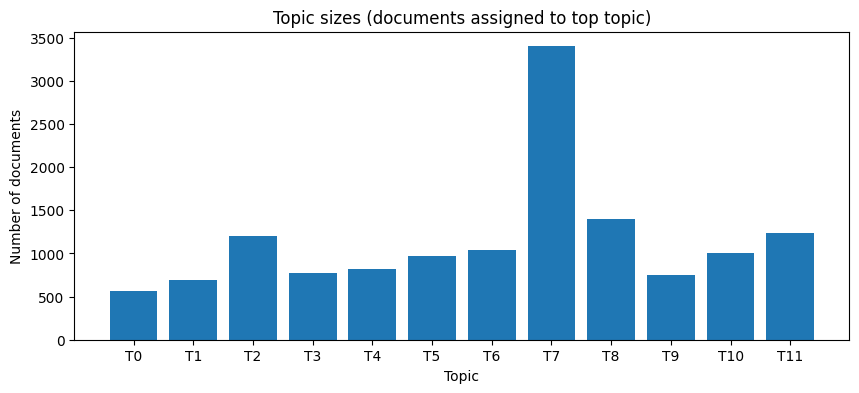

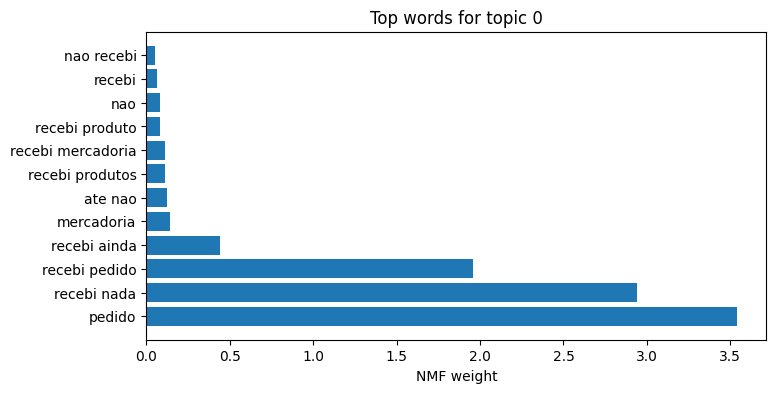

In [58]:
# topic sizes and simple visualizations
topic_assignments = W_norm.argmax(axis=1)    # most probable topic per doc
topic_sizes = Counter(topic_assignments)

# Bar chart of topic sizes
topics_sorted = sorted(topic_sizes.items(), key=lambda x: x[0])
labels = [f"T{t}" for t,_ in topics_sorted]
sizes = [s for _,s in topics_sorted]

plt.figure(figsize=(10,4))
plt.bar(labels, sizes)
plt.title("Topic sizes (documents assigned to top topic)")
plt.xlabel("Topic")
plt.ylabel("Number of documents")
plt.show()

# Plot top words for a selected topic
sel_topic = 0
top_words = get_top_words_for_topic(sel_topic, top_n=12)
words, weights = zip(*top_words)
plt.figure(figsize=(8,4))
plt.barh(range(len(words))[::-1], weights[::-1])
plt.yticks(range(len(words)), words[::-1])
plt.title(f"Top words for topic {sel_topic}")
plt.xlabel("NMF weight")
plt.show()

In [59]:
# Cell 8: representative documents per topic
for t in range(min(6, n_topics)):
    print("\n" + "="*80)
    print(f"Topic {t} — top words:", ", ".join([w for w,_ in get_top_words_for_topic(t,10)]))
    print("-"*80)
    docs = get_top_docs_for_topic(t, top_n=4)
    for i, row in docs.reset_index(drop=True).iterrows():
        print(f"[score={row['score']:.3f}] {row['review_comment_message'][:300]}")


Topic 0 — top words: nao recebi, recebi, nao, recebi produto, recebi mercadoria, recebi produtos, ate nao, mercadoria, recebi ainda, recebi pedido
--------------------------------------------------------------------------------
[score=0.197] não recebi
[score=0.197] Não recebi
[score=0.197] não recebi
[score=0.197] não recebi

Topic 1 — top words: chegou, nao chegou, produto nao, nao, produto, produto chegou, chegou ainda, so chegou, chegou produto, produto ainda
--------------------------------------------------------------------------------
[score=0.244] Não chegou
[score=0.244] Não chegou.
[score=0.244] Não chegou 
[score=0.244] não chegou

Topic 2 — top words: so, dois, comprei, so recebi, produtos, comprei dois, recebi, dois produtos, produtos so, paguei
--------------------------------------------------------------------------------
[score=0.219] Comprei dois produtos e só recebi um!
[score=0.219] Comprei dois produtos e só recebi um!
[score=0.184] Bom dia! 

Comprei dois produt

In [61]:
# verify shapes align
n_docs, n_topics = W_norm.shape
if n_docs != len(df_negative_reviews):
    raise RuntimeError(f"Shape mismatch: W_norm has {n_docs} rows but df_negative_reviews has {len(df_negative_reviews)} rows")

# Build DataFrame only from numeric topic columns first
topic_cols = [f"topic_{i}" for i in range(n_topics)]
doc_topic_df = pd.DataFrame(W_norm, columns=topic_cols)

# assigned_topic as the numeric index of the max column
# idxmax returns e.g. 'topic_3' -> remove 'topic_' and convert to int
doc_topic_df['assigned_topic'] = doc_topic_df.idxmax(axis=1).str.replace('topic_', '', regex=False).astype(int)

# assigned_topic_prob computed over only the numeric topic columns
doc_topic_df['assigned_topic_prob'] = doc_topic_df[topic_cols].max(axis=1).astype(float)

# now safe to add text columns
doc_topic_df['original_text'] = df_negative_reviews['review_comment_message'].astype(str).values
doc_topic_df['cleaned_text'] = corpus  # corpus is the cleaned list we built earlier

# optional: keep the review_score if present for later analysis
if 'review_score' in df_negative_reviews.columns:
    doc_topic_df['review_score'] = df_negative_reviews['review_score'].values

# create output directory if missing
out_path = "review_topics_doc_topic.parquet"
doc_topic_df.to_parquet(out_path, index=False)
print("Saved", out_path)

Saved review_topics_doc_topic.parquet


# Final Model - Causal Impact of MQL Status on Seller Conversion

#### Step 1: Load Data and Prepare Features

In [62]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
import plotly.express as px

# --- 1. Load Causal Feature Data ---
print("Loading causal features from dbt model...")
query = "SELECT * FROM analytics.fct_seller_causal_features"
df_causal = pd.read_sql_query(query, engine)
print(f"Loaded {df_causal.shape[0]} rows.")

# --- 2. Prepare Features (Confounders X), Treatment (T), Outcome (Y) ---
# Define potential confounders (limited by data availability)
confounders = ['business_segment', 'lead_type', 'mql_origin']
treatment = 'is_mql'
outcome = 'is_converted'

# Handle missing values (e.g., fill with 'Unknown' or drop)
# For simplicity here, we'll fill categorical NaNs
for col in confounders:
    if df_causal[col].dtype == 'object':
        df_causal[col].fillna('Unknown', inplace=True)

# One-hot encode the confounders
X = pd.get_dummies(df_causal[confounders], columns=confounders, drop_first=True)
T = df_causal[treatment]
y = df_causal[outcome]

print("\nData prepared for propensity score modeling:")
print(f"Features (X) shape: {X.shape}")

Loading causal features from dbt model...
Loaded 3095 rows.

Data prepared for propensity score modeling:
Features (X) shape: (3095, 45)


#### Step 2: Estimate Propensity Scores
Train a model to predict the probability of a seller being an MQL based on their features.

In [63]:
# --- 3. Train Propensity Score Model ---
print("\nTraining propensity score model (Logistic Regression)...")
propensity_model = LogisticRegression(random_state=42, class_weight='balanced')
propensity_model.fit(X, T)

# Predict propensity scores (probability of being treated, T=1)
propensity_scores = propensity_model.predict_proba(X)[:, 1]
df_causal['propensity_score'] = propensity_scores
print("✅ Propensity scores calculated.")


Training propensity score model (Logistic Regression)...
✅ Propensity scores calculated.


#### Step 3: Assess Overlap (Common Support)
Visualize the distribution of propensity scores for the treated (MQL) and control (non-MQL) groups. We need sufficient overlap to make valid comparisons.


Assessing propensity score overlap...


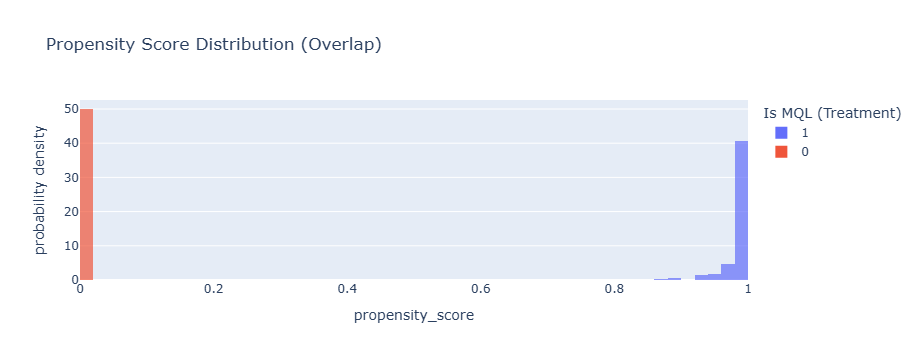

Min propensity score: 0.0161
Max propensity score: 0.9987
⚠️ Warning: Some scores are close to 0 or 1. Consider trimming.


In [64]:
# --- 4. Assess Overlap ---
print("\nAssessing propensity score overlap...")
fig = px.histogram(df_causal, x='propensity_score', color=treatment,
                   nbins=50, title='Propensity Score Distribution (Overlap)',
                   labels={treatment: 'Is MQL (Treatment)'},
                   barmode='overlay', histnorm='probability density',
                   opacity=0.7)
fig.show()

# --- Check for extreme scores ---
min_score = df_causal['propensity_score'].min()
max_score = df_causal['propensity_score'].max()
print(f"Min propensity score: {min_score:.4f}")
print(f"Max propensity score: {max_score:.4f}")

# Define a practical overlap region (avoid scores too close to 0 or 1)
overlap_threshold = 0.01
if min_score < overlap_threshold or max_score > (1 - overlap_threshold):
    print(f"⚠️ Warning: Some scores are close to 0 or 1. Consider trimming.")
else:
    print("✅ Good overlap observed.")

#### Step 4: Estimate ATE using IPTW
Calculate the weights and estimate the causal effect.

In [65]:
# --- 5. Estimate Average Treatment Effect (ATE) using IPTW ---

# Calculate IPTW weights
weights = np.where(T == 1, 1 / df_causal['propensity_score'], 1 / (1 - df_causal['propensity_score']))
df_causal['iptw_weight'] = weights

# Calculate weighted means for treated and control groups
mean_outcome_treated = np.average(y[T == 1], weights=weights[T == 1])
mean_outcome_control = np.average(y[T == 0], weights=weights[T == 0])

# Calculate ATE
ate_iptw = mean_outcome_treated - mean_outcome_control

print("\n--- Causal Effect Estimation (IPTW) ---")
print(f"Weighted mean outcome for Treated (MQL=1): {mean_outcome_treated:.4f}")
print(f"Weighted mean outcome for Control (MQL=0): {mean_outcome_control:.4f}")
print(f"Estimated Average Treatment Effect (ATE): {ate_iptw:.4f}")

# Simple unadjusted difference for comparison
unadjusted_diff = y[T == 1].mean() - y[T == 0].mean()
print(f"\nSimple difference in means (Unadjusted): {unadjusted_diff:.4f}")


--- Causal Effect Estimation (IPTW) ---
Weighted mean outcome for Treated (MQL=1): 1.0000
Weighted mean outcome for Control (MQL=0): 0.0000
Estimated Average Treatment Effect (ATE): 1.0000

Simple difference in means (Unadjusted): 1.0000


### Interpretation: A Data Limitation Artifact
This perfect ATE of 1.0 strongly indicates a limitation in our data structure, rather than a true causal effect of this magnitude. Here's why:
* **Outcome Availability:** Our `is_converted` outcome variable was derived only from the `closed_deals` table. Sellers who are not MQLs (our control group) are largely absent from this table.
* **Perfect Separation:** This means nearly all sellers in our "Treated" group (MQL=1) have `is_converted = 1`, while nearly all sellers in our "Control" group (MQL=0) have `is_converted = 0` simply because we lack outcome data for the control group.
* **Result:** Both the unadjusted difference and the IPTW-adjusted difference calculate a near-perfect separation (1.0 - 0.0 = 1.0). The weighting cannot fix the underlying issue that we don't observe conversions for the control group.

**Conclusion:** Due to the way the data was collected and structured (focusing primarily on the MQL funnel), we **cannot reliably estimate the causal effect** of being an MQL versus not being an MQL using this dataset. We lack the necessary outcome information for the non-MQL sellers.

### Next Step: Predictive Modeling within MQLs
While true causal inference comparing MQLs vs. non-MQLs isn't feasible, we can still gain valuable insights by building a standard **predictive model** focused only on the MQL population.

**New Goal:** Predict which MQLs are most likely to convert (`is_converted = 1`) based on their characteristics (`business_segment`, `lead_type`, `mql_origin`).


#### Step 5: Filter and Prepare Data

In [66]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import plotly.express as px

# --- 1. Filter for MQLs Only ---
df_mql = df_causal[df_causal['is_mql'] == 1].copy()
print(f"Filtered down to {df_mql.shape[0]} MQLs.")

# --- 2. Prepare Features (X) and Target (y) ---
# Features are the characteristics of the MQL
features = ['business_segment', 'lead_type', 'mql_origin']
target = 'is_converted'

# Handle missing values if any remain (though we filled them before)
for col in features:
    if df_mql[col].dtype == 'object':
        df_mql[col].fillna('Unknown', inplace=True)

# One-hot encode the features
X_mql = pd.get_dummies(df_mql[features], columns=features, drop_first=True)
y_mql = df_mql[target]

print(f"Features shape: {X_mql.shape}")
print("\nClass distribution for MQL conversion:")
print(y_mql.value_counts(normalize=True))
print("-" * 30)

Filtered down to 380 MQLs.
Features shape: (380, 44)

Class distribution for MQL conversion:
is_converted
1    1.0
Name: proportion, dtype: float64
------------------------------


### The Reality Check
I suggested building the "Predictive Modeling within MQLs" model based on the possibility that the MQL dataset (`marketing_qualified_leads` joined with `closed_deals`) might contain examples of MQLs who did not eventually convert. The goal was to see if the features gathered during the MQL stage (`like lead_type`, `business_segment`, `mql_origin`) could predict which MQLs were likely to succeed versus those who might drop out. This is a standard and valuable analysis if the necessary data exists. I assumed there might be MQLs without a corresponding entry in `closed_deals`.

However, the above output completely invalidated that assumption. It tells us definitively that **100% of the MQLs** in the dataset we prepared have `is_converted = 1`. There are **zero examples** of MQLs who did not convert (`is_converted = 0`). One cannot train a machine learning classifier if the target variable has only one value.